In [1]:
library(classInt)
library(RColorBrewer)
library(GWmodel)
library(e1071)
library(grid)
library(rgdal)
library(ggplot2)

Loading required package: spData
To access larger datasets in this package, install the spDataLarge
package with: `install.packages('spDataLarge',
repos='https://nowosad.github.io/drat/', type='source'))`
Loading required package: maptools
Loading required package: sp
Checking rgeos availability: TRUE
Loading required package: robustbase
Loading required package: Rcpp
Loading required package: spdep
Loading required package: Matrix
Welcome to GWmodel version 2.0-8.
 Note: This verision has been re-built with RcppArmadillo to improve its performance.
The new version of GWmodel 2.0-8 now is ready, and new functions have been incorporated or improved:
 1) gwr.multiscale, multiscale GWR


In [2]:
ROOT <- '/Users/dongmeichen/Documents/beetle'
DATA <- sprintf('%s/data', ROOT)
data <- read.csv(sprintf('%s/mpb10km_data_wo_FIA.csv', DATA))
results <- read.csv(sprintf('%s/gwr_results_wo_FIA.csv', DATA))
head(data)
head(results)

lon,lat,etopo1,beetleAcres,host,forest,mStdAge,density,vcc,mfri,⋯,Tmin,winterMin,summerTmean,Pmean,summerP1,minT,JanMin,TOctSep,Jan20,PcumOctSep
-124.1712,40.22942,365.1772,0.80,1,1,25.50000,58050.83,1,2,⋯,3.799283,-1.050936,13.39157,147.6052,24.63396,-1.142272,0.77218069,10.28896,0,3588.627
-124.0860,40.42007,493.0852,0.80,0,1,42.46217,52809.04,1,2,⋯,3.858750,-1.872970,14.15700,136.2772,25.59386,-1.986082,-0.02538966,10.65948,0,3310.186
-123.9379,40.25447,487.5240,0.80,1,1,169.82977,54385.98,1,2,⋯,3.853568,-2.322706,15.26891,131.7037,22.97331,-2.402099,-0.42077545,11.30121,0,3203.155
-123.9535,40.34353,350.6961,0.80,0,1,249.11995,47005.25,1,2,⋯,4.731104,-2.289419,15.96638,127.5623,21.96572,-2.376570,-0.38369531,12.05334,0,3101.846
-124.2945,42.21193,387.5008,2.10,1,1,102.39621,51167.16,3,2,⋯,3.569939,-1.609584,14.75741,144.9382,63.31930,-1.701227,0.26865842,10.65064,0,3508.975
-124.3114,42.30082,409.5534,331.05,1,1,83.12288,54697.57,3,2,⋯,2.772311,-1.861916,14.02822,145.8606,65.28476,-1.954968,0.04758294,9.89128,0,3531.298


sum.w,X.Intercept.,lon,lat,etopo1,host,forest,density,vcc,prs,⋯,winterMin_se_EDF,summerTmean_se_EDF,Pmean_se_EDF,minT_se_EDF,JanMin_se_EDF,TOctSep_se_EDF,PcumOctSep_se_EDF,pred.se.1,coord.x,coord.y
136.0645,-20.752239,-0.11903995,0.1354327,1.541748e-04,-0.06196741,0.032240067,-5.201852e-07,-0.005699180,0.0014235779,⋯,0.1274362,0.3252083,0.09232047,0.1285575,0.03713822,10.14437,0.005190198,0.05182593,-990000,-460000
133.5617,-23.586673,-0.13628431,0.1425797,1.496478e-04,-0.06548003,0.034859782,-4.607779e-07,-0.005232943,0.0018508888,⋯,0.1378797,0.3563538,0.10187389,0.1380549,0.03904079,11.17299,0.005719952,0.03821627,-980000,-440000
121.0727,-26.419839,-0.15428819,0.1483849,1.749410e-04,-0.06767985,0.032341587,-8.861320e-07,-0.008460219,0.0018284606,⋯,0.1568578,0.3849598,0.11425669,0.1584094,0.04605586,13.08856,0.006540791,0.03562960,-970000,-460000
125.1384,-25.844902,-0.15084033,0.1446980,1.658190e-04,-0.06810328,0.033989411,-7.257144e-07,-0.007440363,0.0019357750,⋯,0.1535507,0.3840984,0.11306125,0.1543119,0.04448668,12.62108,0.006434800,0.04035994,-970000,-450000
112.5545,-3.095264,0.04475106,0.2401097,7.961380e-05,0.01267380,0.003319291,-5.498453e-08,0.002026209,-0.0008959302,⋯,0.1544596,0.5867899,0.29858600,0.1349268,0.04640401,16.44741,0.014845385,0.03365932,-970000,-240000
110.9434,-6.222201,0.01362021,0.2247442,7.579213e-05,0.01440381,0.003150566,-1.363475e-07,0.001297780,-0.0007688417,⋯,0.1590722,0.5989924,0.31418589,0.1352904,0.04923751,16.79769,0.015494084,0.03681679,-970000,-230000


In [3]:
xy <- read.csv(sprintf('%s/mpb10km_data_wo_FIA_xy.csv', DATA))

In [4]:
colnames(data)

[1] "lon"         "lat"         "etopo1"      "beetleAcres" "host"       
 [6] "forest"      "mStdAge"     "density"     "vcc"         "mfri"       
[11] "prs"         "pms"         "pls"         "GAP1"        "GAP2"       
[16] "GAP3"        "vpd"         "cwd"         "maxAugT"     "summerP0"   
[21] "Tmean"       "mi"          "Tvar"        "wd"          "AugTmean"   
[26] "OctTmin"     "AugMaxT"     "AugTmax"     "Acs"         "MarMin"     
[31] "ddAugJun"    "ddAugJul"    "JanTmin"     "PPT"         "summerP2"   
[36] "TMarAug"     "Mar20"       "fallTmean"   "MarTmin"     "maxT"       
[41] "Tmin"        "winterMin"   "summerTmean" "Pmean"       "summerP1"   
[46] "minT"        "JanMin"      "TOctSep"     "Jan20"       "PcumOctSep"

In [5]:
coeffs <- results[, colnames(results)[colnames(results) %in% colnames(data)]]

In [6]:
head(coeffs)

lon,lat,etopo1,host,forest,density,vcc,prs,GAP1,GAP3,⋯,MarTmin,maxT,Tmin,winterMin,summerTmean,Pmean,minT,JanMin,TOctSep,PcumOctSep
-0.11903995,0.1354327,1.541748e-04,-0.06196741,0.032240067,-5.201852e-07,-0.005699180,0.0014235779,0.005168702,0.0069092228,⋯,-0.1447542,0.05983144,-0.098265395,-0.25624641,0.040434780,-0.3016855,0.11504276,0.18862347,40.26040,0.01554744
-0.13628431,0.1425797,1.496478e-04,-0.06548003,0.034859782,-4.607779e-07,-0.005232943,0.0018508888,0.005831014,0.0055540611,⋯,-0.1871108,0.06601541,-0.111633346,-0.31696682,-0.066982069,-0.3495876,0.17019750,0.19278653,42.24944,0.01821450
-0.15428819,0.1483849,1.749410e-04,-0.06767985,0.032341587,-8.861320e-07,-0.008460219,0.0018284606,0.010811255,-0.0012157249,⋯,-0.1713159,0.08451885,-0.116670849,-0.28005524,0.067516899,-0.3868536,0.12212107,0.21069700,45.78909,0.02018343
-0.15084033,0.1446980,1.658190e-04,-0.06810328,0.033989411,-7.257144e-07,-0.007440363,0.0019357750,0.009488578,0.0004126048,⋯,-0.1919400,0.08060177,-0.121243785,-0.31205430,0.005072387,-0.3887588,0.15576491,0.20745483,44.87500,0.02037196
0.04475106,0.2401097,7.961380e-05,0.01267380,0.003319291,-5.498453e-08,0.002026209,-0.0008959302,-0.014307195,0.0190948589,⋯,-0.1754150,-0.02970856,0.011953519,0.08899551,-0.036673692,-0.4404473,-0.08814479,-0.05291292,43.13903,0.01866486
0.01362021,0.2247442,7.579213e-05,0.01440381,0.003150566,-1.363475e-07,0.001297780,-0.0007688417,-0.015698218,0.0182054270,⋯,-0.1366218,-0.03782912,-0.003790708,0.09763471,-0.102374765,-0.4129432,-0.09252024,-0.06823957,41.94207,0.01766363


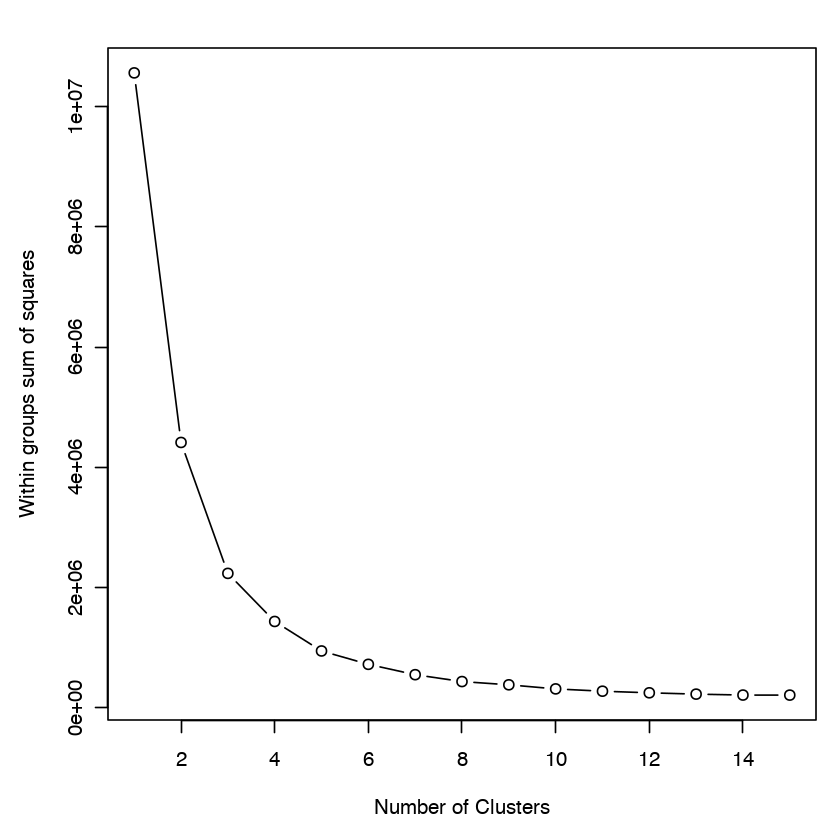

In [254]:
wss <- (nrow(coeffs)-1)*sum(apply(coeffs,2,var))
par(mfrow=c(1,1),mar=c(5,4.5,2,1))
for (i in 2:15) wss[i] <- sum(kmeans(coeffs, centers=i)$withinss)
plot(1:15, wss, type="b", xlab="Number of Clusters",
     ylab="Within groups sum of squares") 

In [255]:
ncluster <- 3
fit <- kmeans(coeffs, ncluster)
nclr <- ncluster
plotclr <- brewer.pal(nclr,"Set1")

In [9]:
mpb10km_poly <- readOGR(dsn='/Users/dongmeichen/Documents/beetle/shp', 
                           layer='mpb10km')
mpb_projstr <- "+proj=laea +lon_0=-112.5 +lat_0=45 +x_0=0 +y_0=0 +ellps=WGS84 +datum=WGS84 +units=m +no_defs"
proj4string(mpb10km_poly) <- mpb_projstr
mpb10km_lines <- fortify(mpb10km_poly, region="SP_ID")

rgdal: version: 1.2-18, (SVN revision 718)
 Geospatial Data Abstraction Library extensions to R successfully loaded
 Loaded GDAL runtime: GDAL 2.1.3, released 2017/20/01
 Path to GDAL shared files: /Library/Frameworks/R.framework/Versions/3.4/Resources/library/rgdal/gdal
 GDAL binary built with GEOS: FALSE 
 Loaded PROJ.4 runtime: Rel. 4.9.3, 15 August 2016, [PJ_VERSION: 493]
 Path to PROJ.4 shared files: /Library/Frameworks/R.framework/Versions/3.4/Resources/library/rgdal/proj
 Linking to sp version: 1.2-7 


OGR data source with driver: ESRI Shapefile 
Source: "/Users/dongmeichen/Documents/beetle/shp", layer: "mpb10km"
with 17 features
It has 2 fields


Warning message in ReplProj4string(obj, CRS(value)):
“A new CRS was assigned to an object with an existing CRS:
+proj=laea +lat_0=45 +lon_0=-112.5 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs +ellps=WGS84 +towgs84=0,0,0
without reprojecting.
For reprojection, use function spTransform”

In [10]:
data.gwr <- cbind(data, xy)

In [231]:
coef.vars <- colnames(coeffs)[!(colnames(coeffs) %in% c('host', 'forest'))]

In [241]:
summary(data$beetleAcres)
summary((data$beetleAcres)^0.05)

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
    0.09    14.13    96.91   528.28   554.86 12031.01 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.8866  1.1416  1.2569  1.2555  1.3715  1.5996 

Warning message:
“Non Lab interpolation is deprecated”

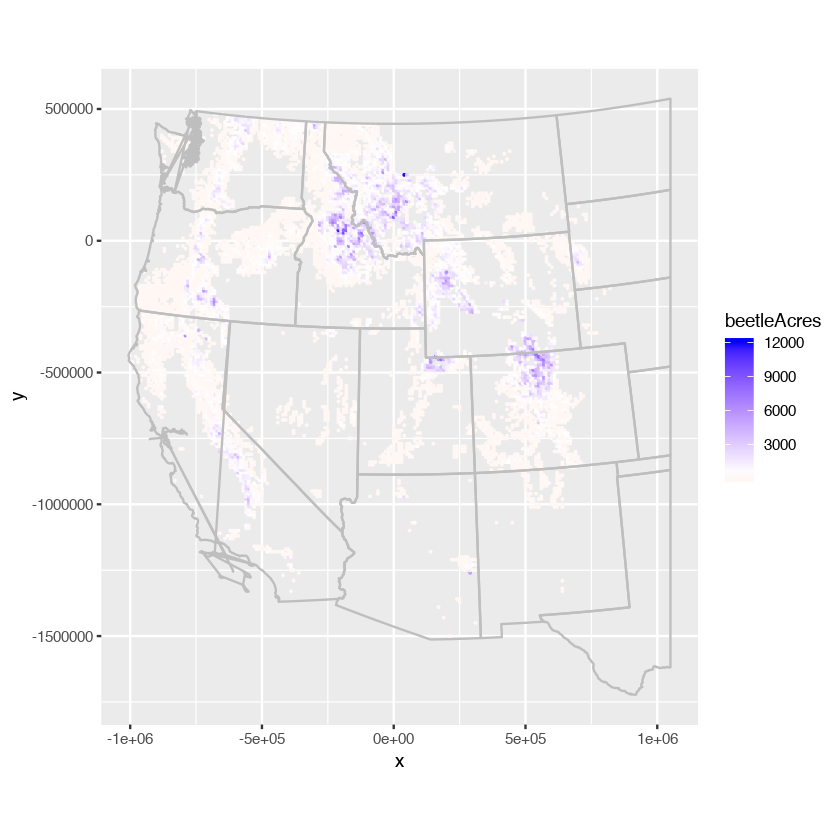

In [242]:
gwr.pt <- ggplot(data.gwr, aes(x=x,y=y))+geom_point(aes(colour=data$beetleAcres), size=0.05)+
  scale_colour_gradient2(low = "red", mid = "white", high = "blue", midpoint = 500, space = "rgb", 
                         na.value = "grey50", guide = "colourbar", guide_legend(title='beetleAcres'))
gwr.pt+geom_path(data=mpb10km_lines,aes(long, lat, group=id), colour="grey")+coord_equal()

Warning message:
“Non Lab interpolation is deprecated”

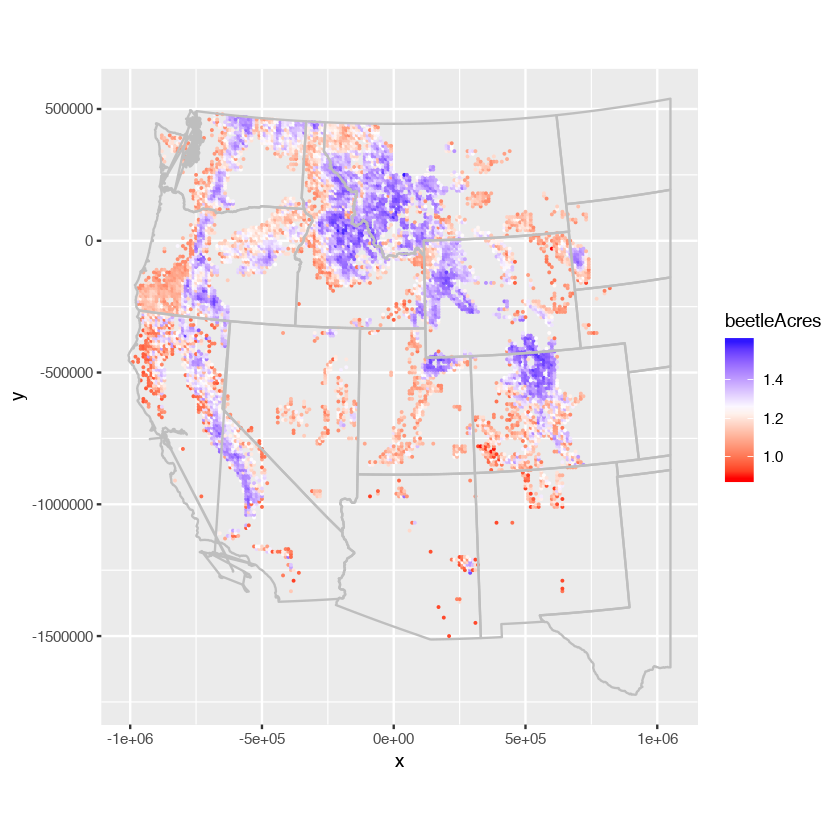

In [240]:
gwr.pt <- ggplot(data.gwr, aes(x=x,y=y))+geom_point(aes(colour=(data$beetleAcres)^0.05), size=0.05)+
  scale_colour_gradient2(low = "red", mid = "white", high = "blue", midpoint = 1.25, space = "rgb", 
                         na.value = "grey50", guide = "colourbar", guide_legend(title='beetleAcres'))
gwr.pt+geom_path(data=mpb10km_lines,aes(long, lat, group=id), colour="grey")+coord_equal()

Warning message:
“Non Lab interpolation is deprecated”Warning message:
“Non Lab interpolation is deprecated”Warning message:
“Non Lab interpolation is deprecated”

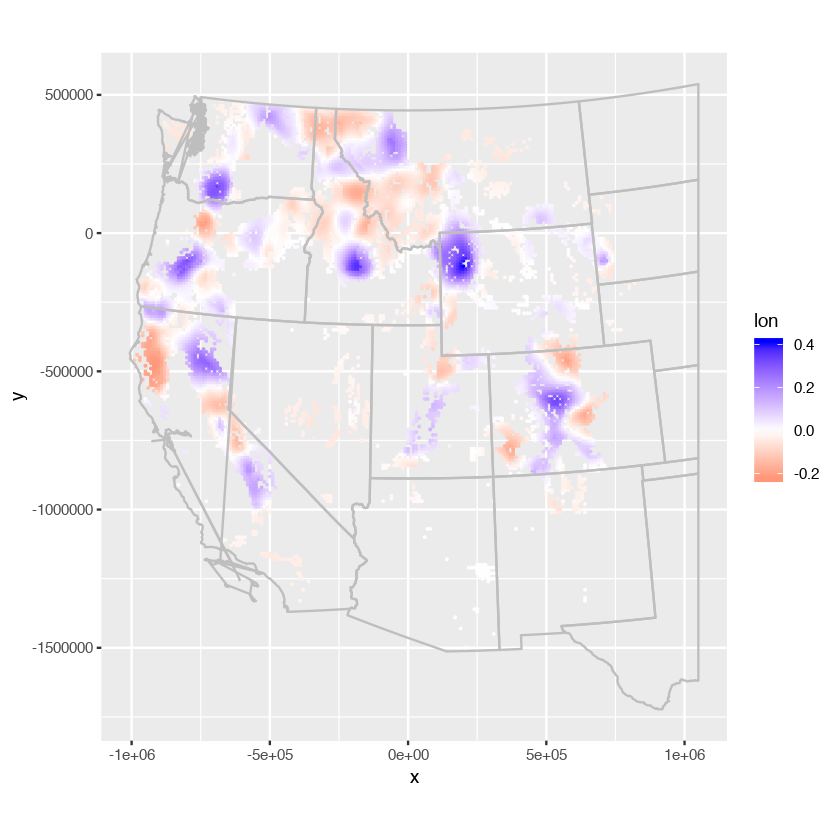

Warning message:
“Non Lab interpolation is deprecated”

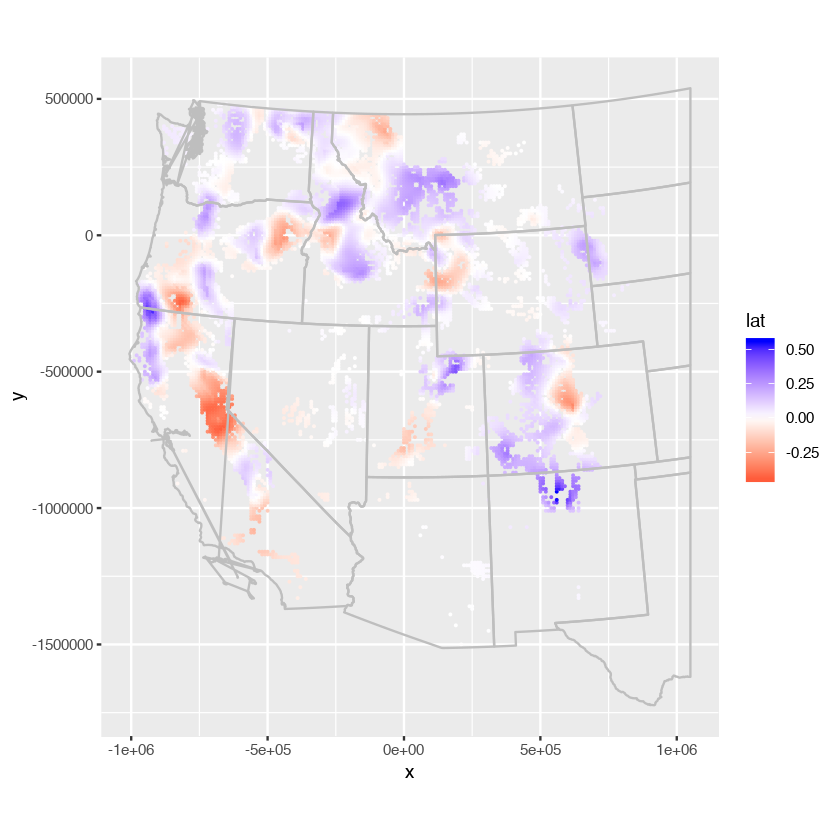

Warning message:
“Non Lab interpolation is deprecated”

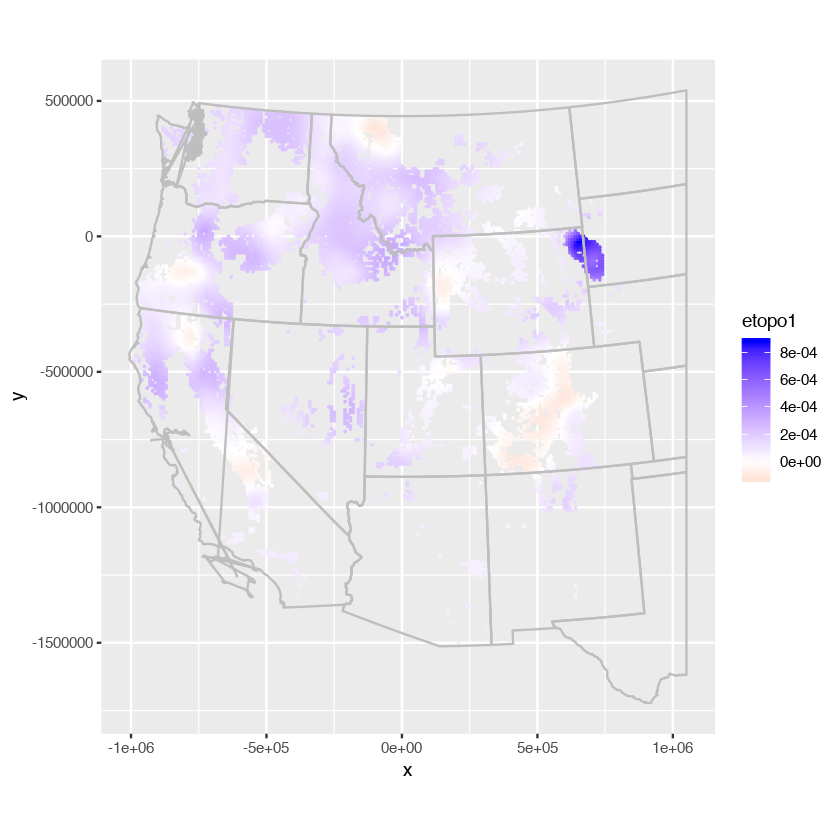

Warning message:
“Non Lab interpolation is deprecated”

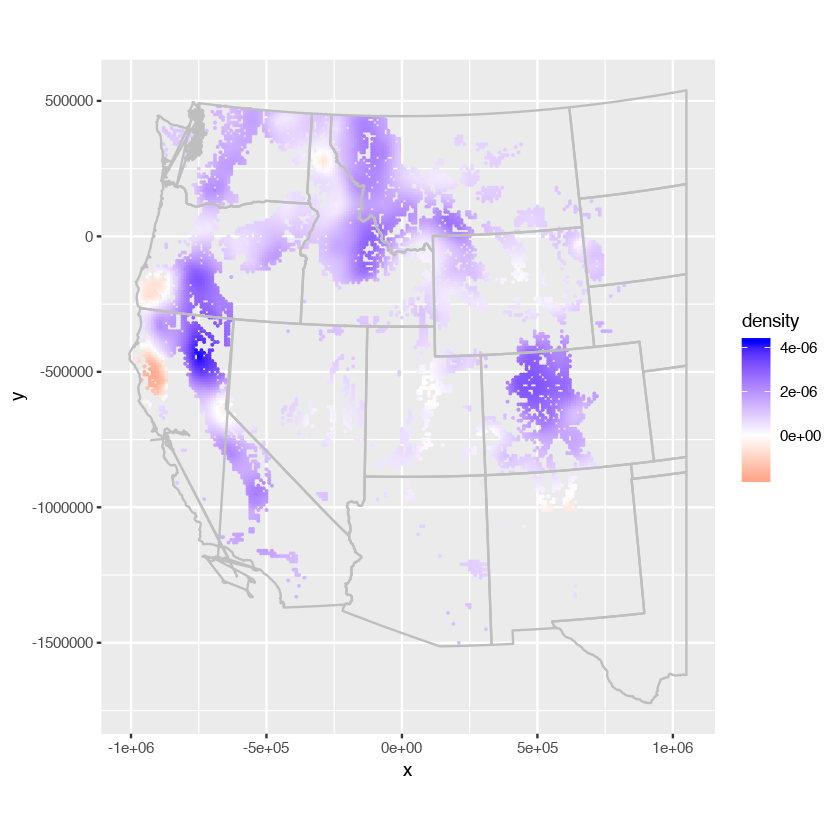

Warning message:
“Non Lab interpolation is deprecated”

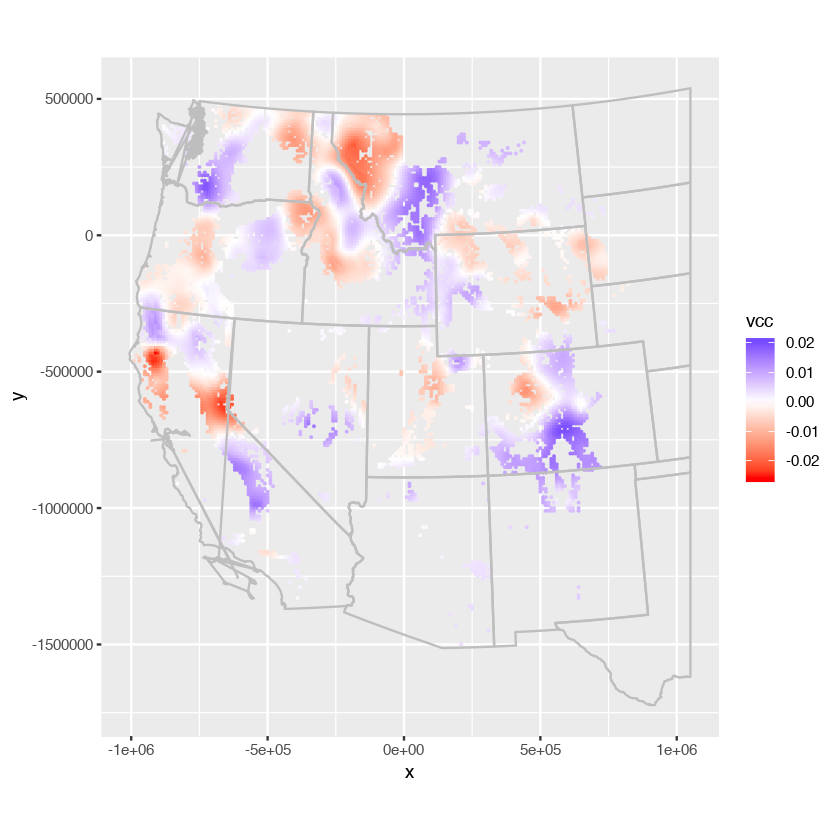

Warning message:
“Non Lab interpolation is deprecated”

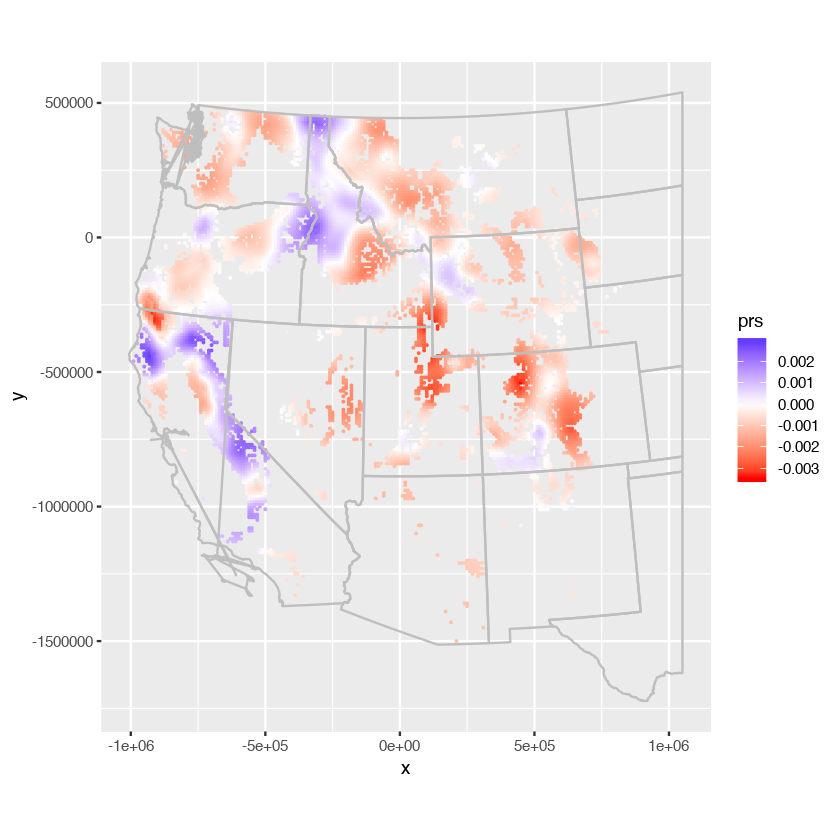

Warning message:
“Non Lab interpolation is deprecated”

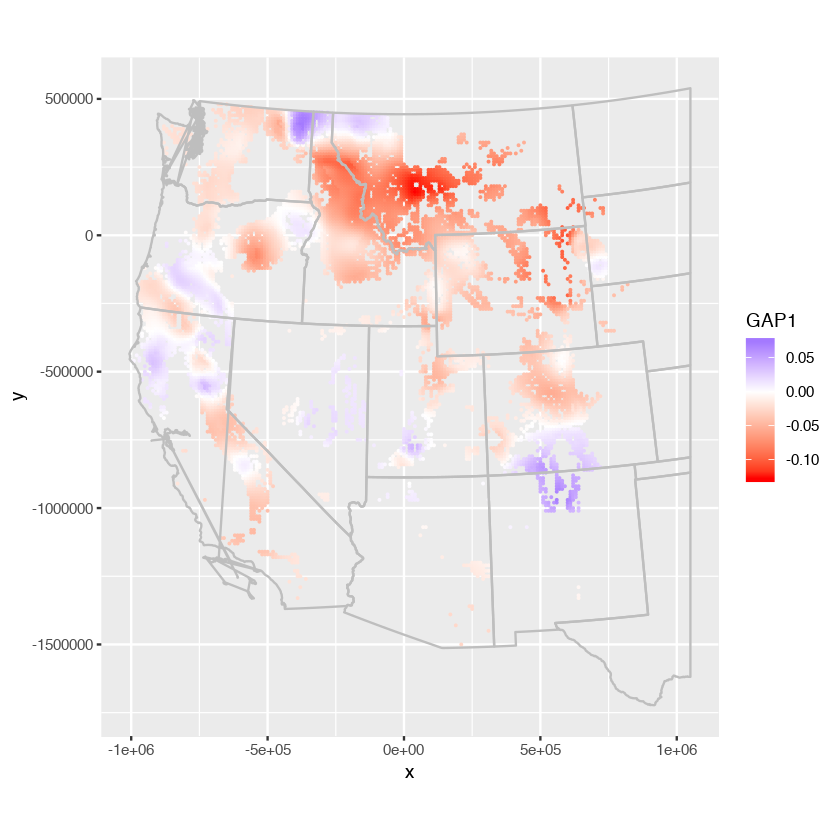

Warning message:
“Non Lab interpolation is deprecated”

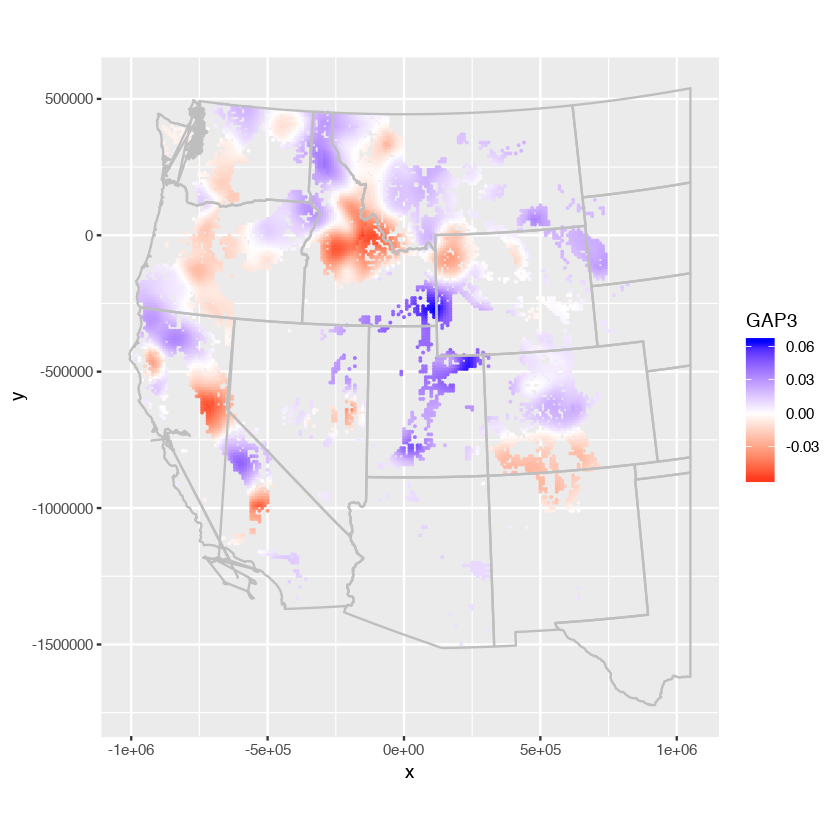

Warning message:
“Non Lab interpolation is deprecated”

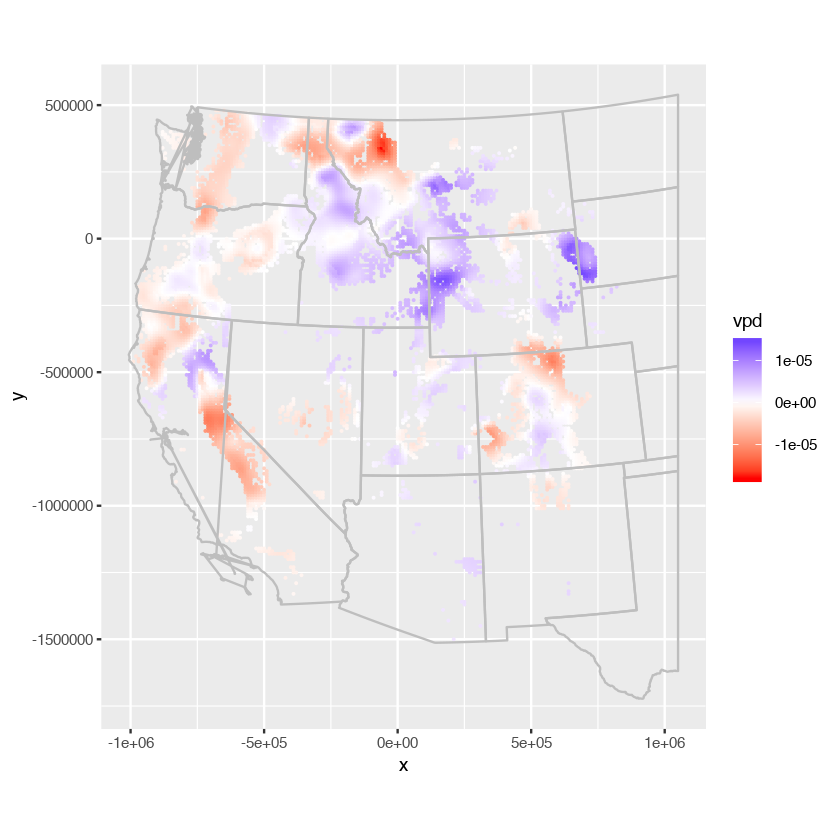

Warning message:
“Non Lab interpolation is deprecated”

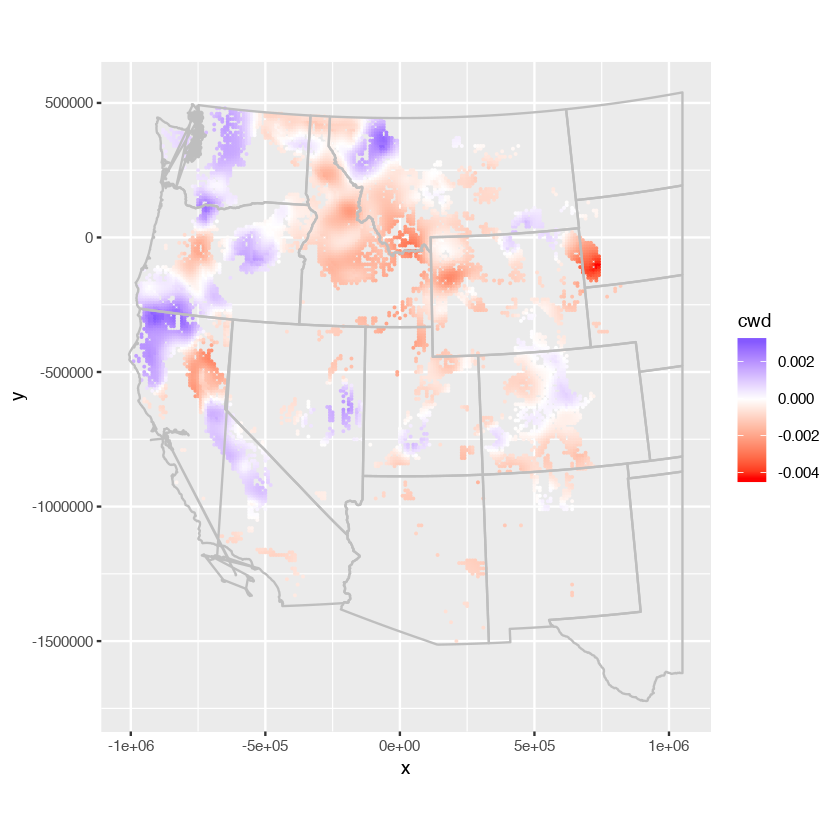

Warning message:
“Non Lab interpolation is deprecated”

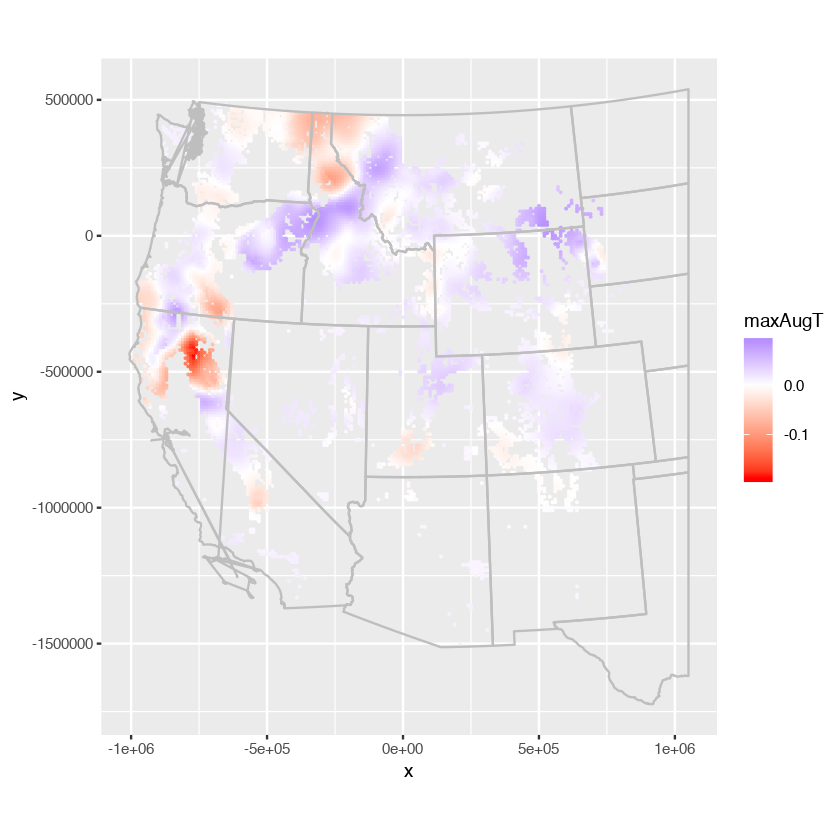

Warning message:
“Non Lab interpolation is deprecated”

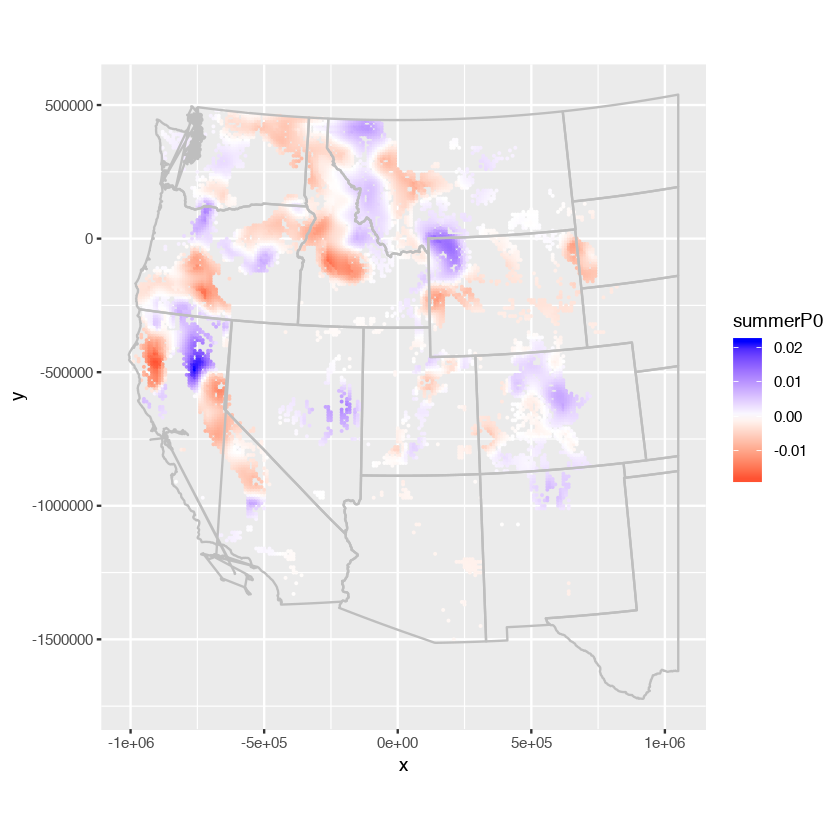

Warning message:
“Non Lab interpolation is deprecated”

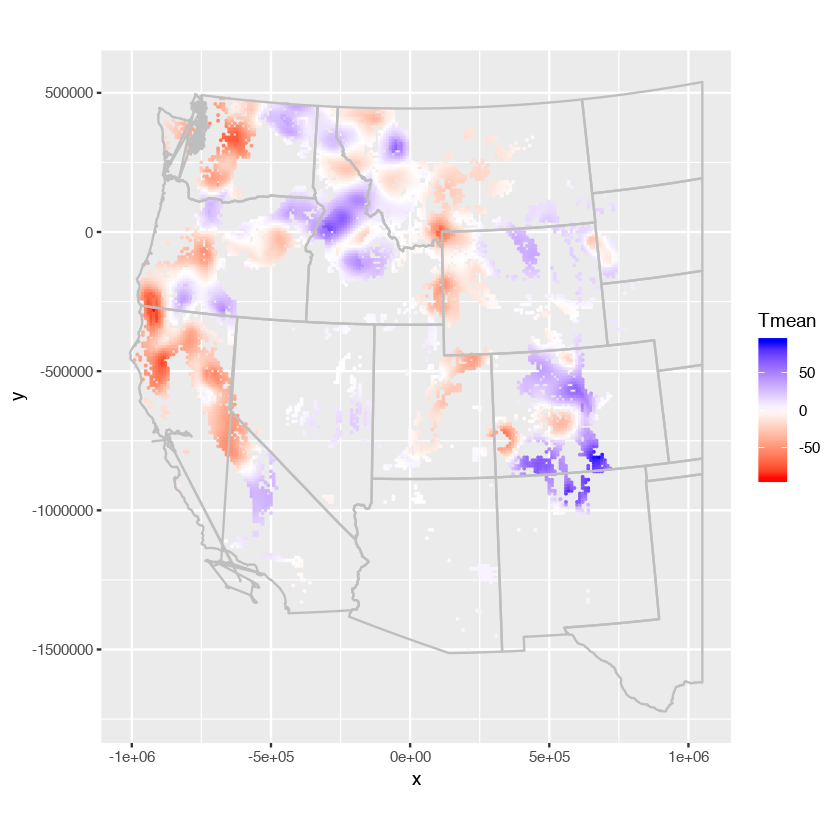

Warning message:
“Non Lab interpolation is deprecated”

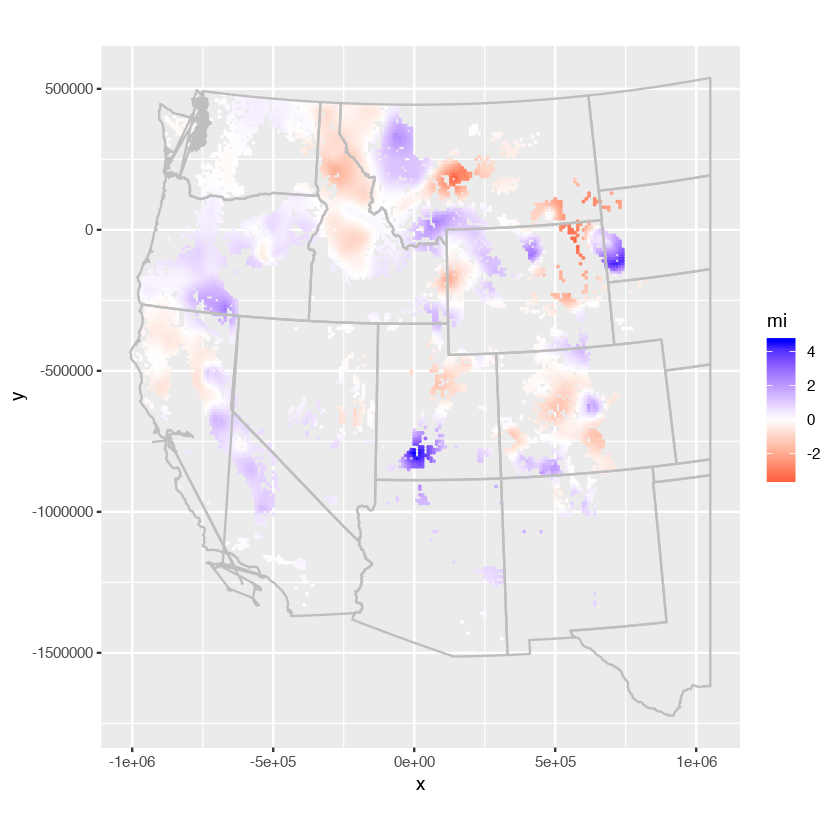

Warning message:
“Non Lab interpolation is deprecated”

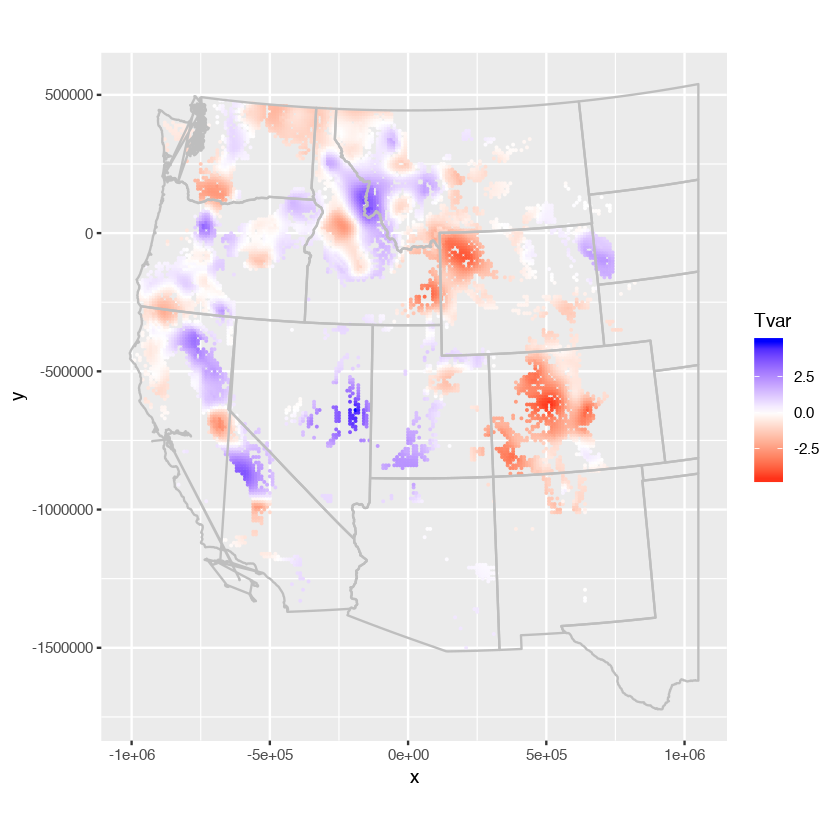

Warning message:
“Non Lab interpolation is deprecated”

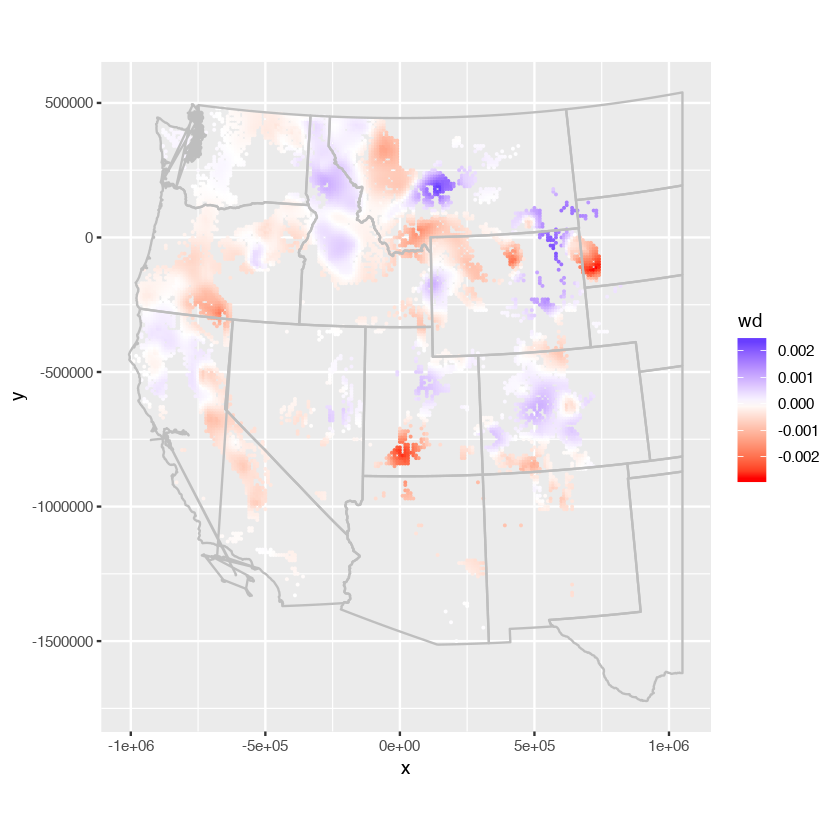

Warning message:
“Non Lab interpolation is deprecated”

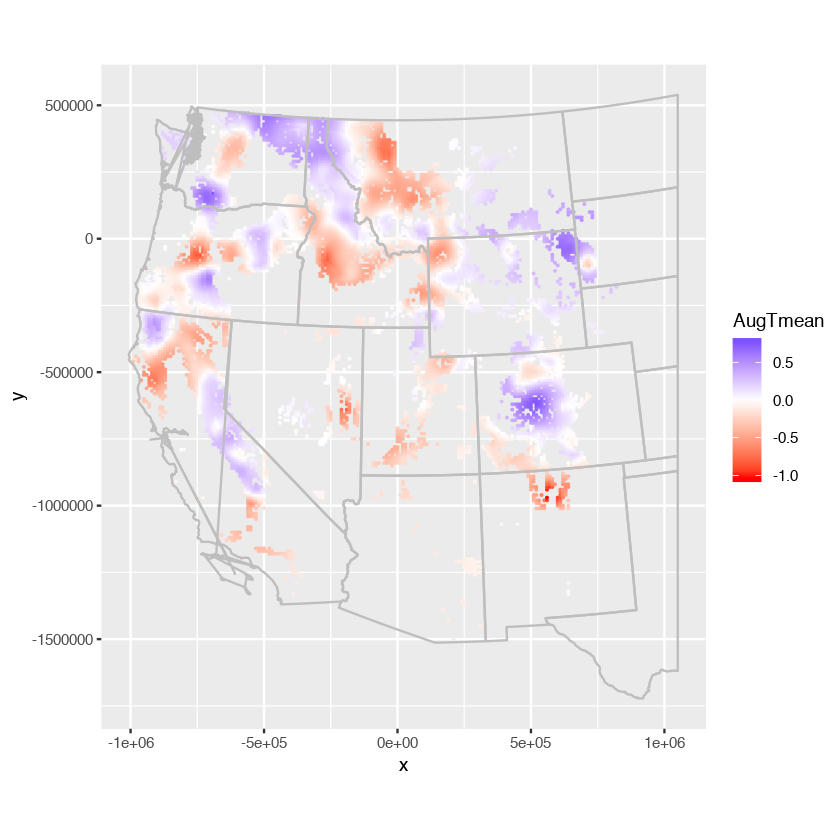

Warning message:
“Non Lab interpolation is deprecated”

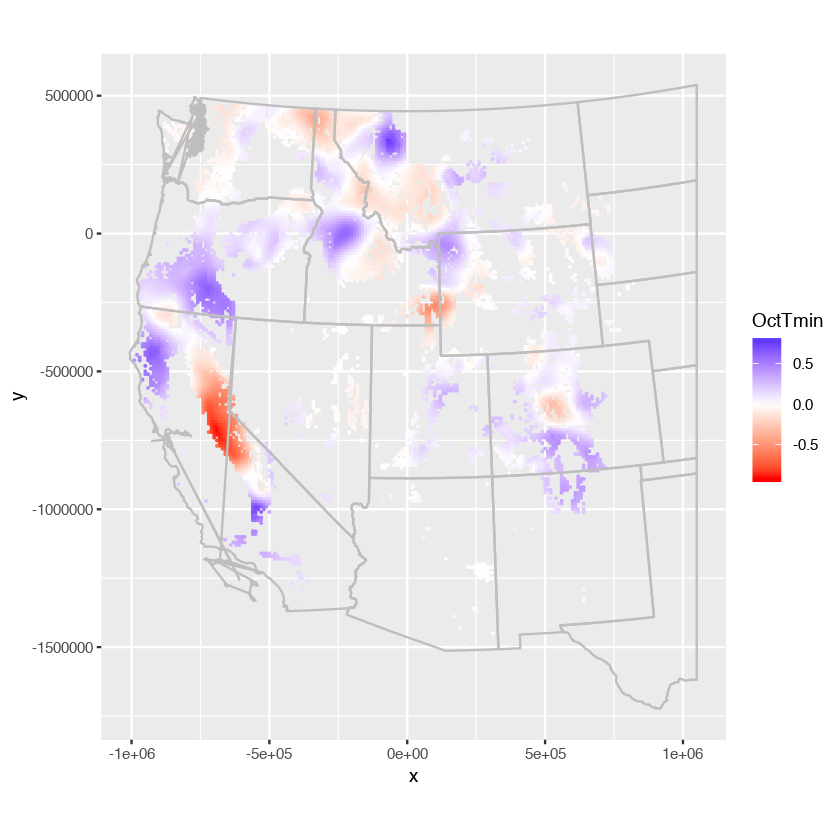

Warning message:
“Non Lab interpolation is deprecated”

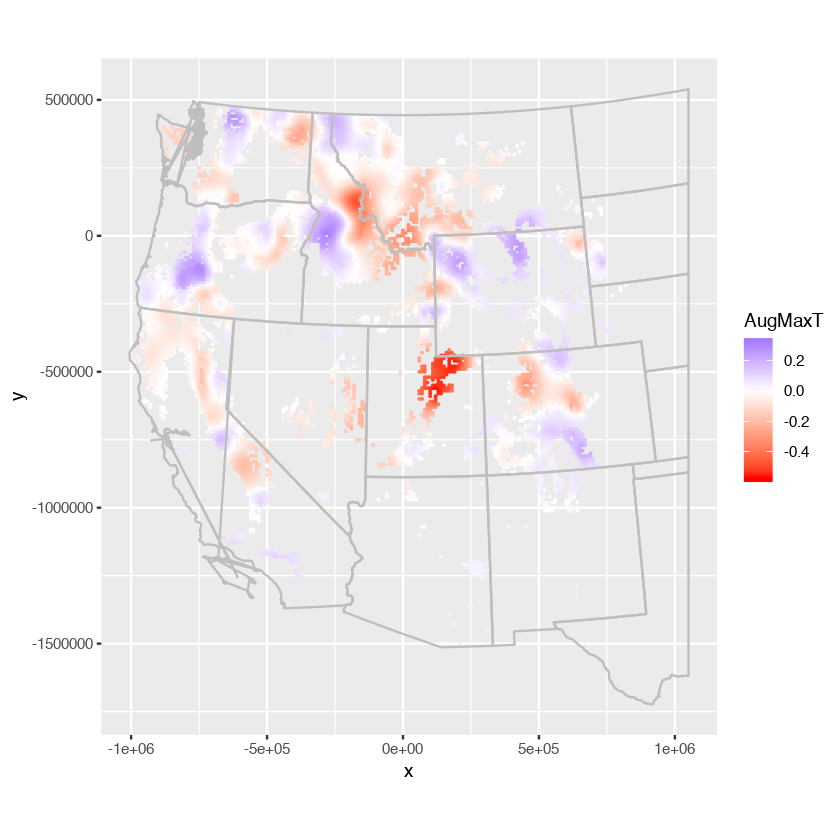

Warning message:
“Non Lab interpolation is deprecated”

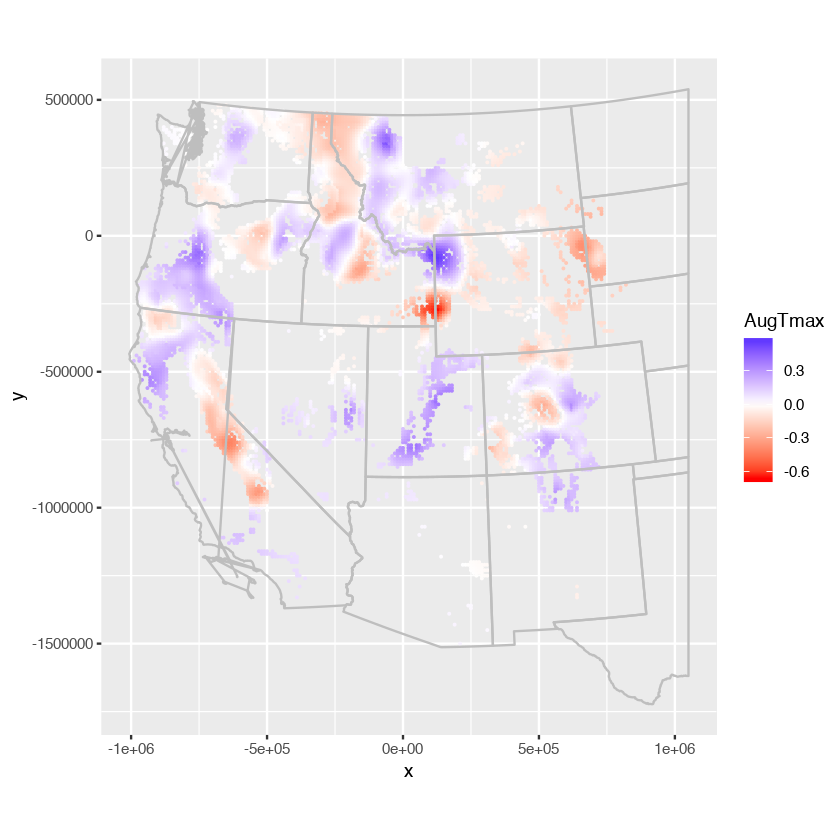

Warning message:
“Non Lab interpolation is deprecated”

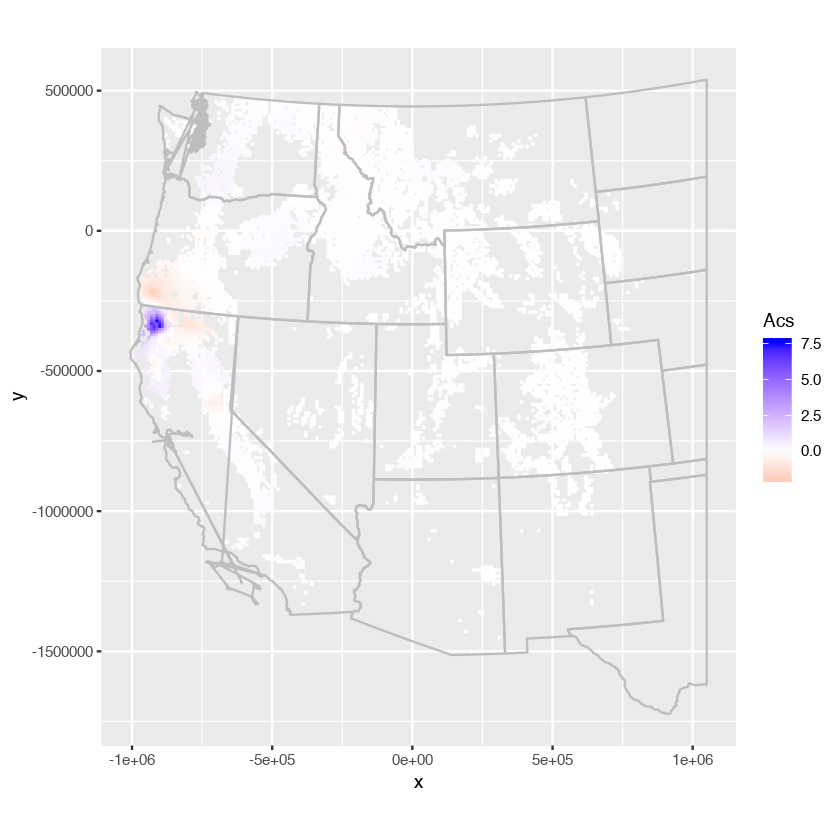

Warning message:
“Non Lab interpolation is deprecated”

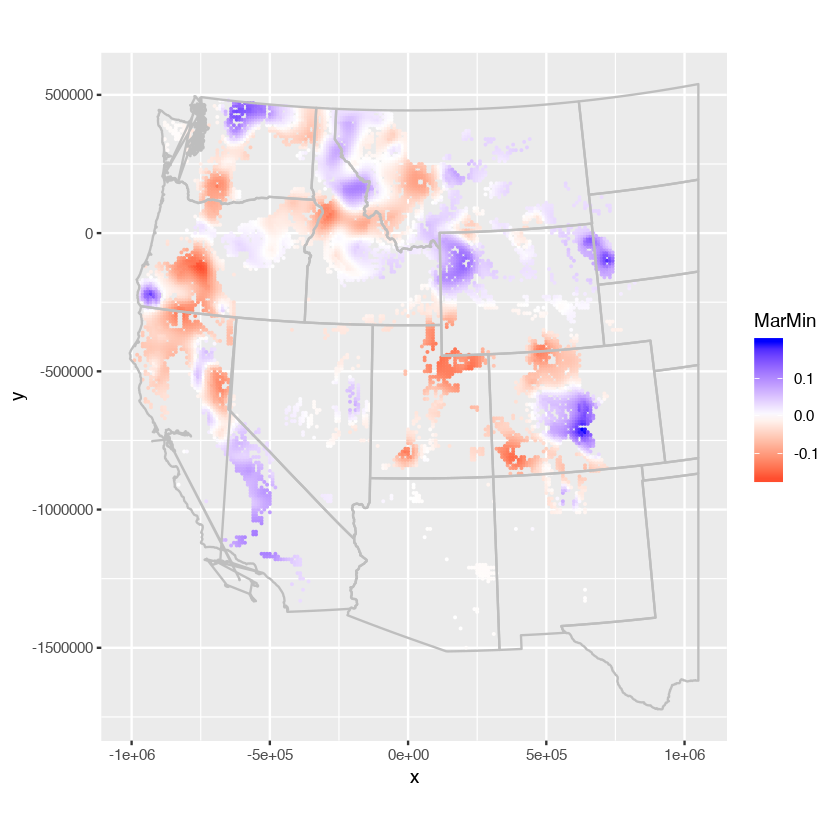

Warning message:
“Non Lab interpolation is deprecated”

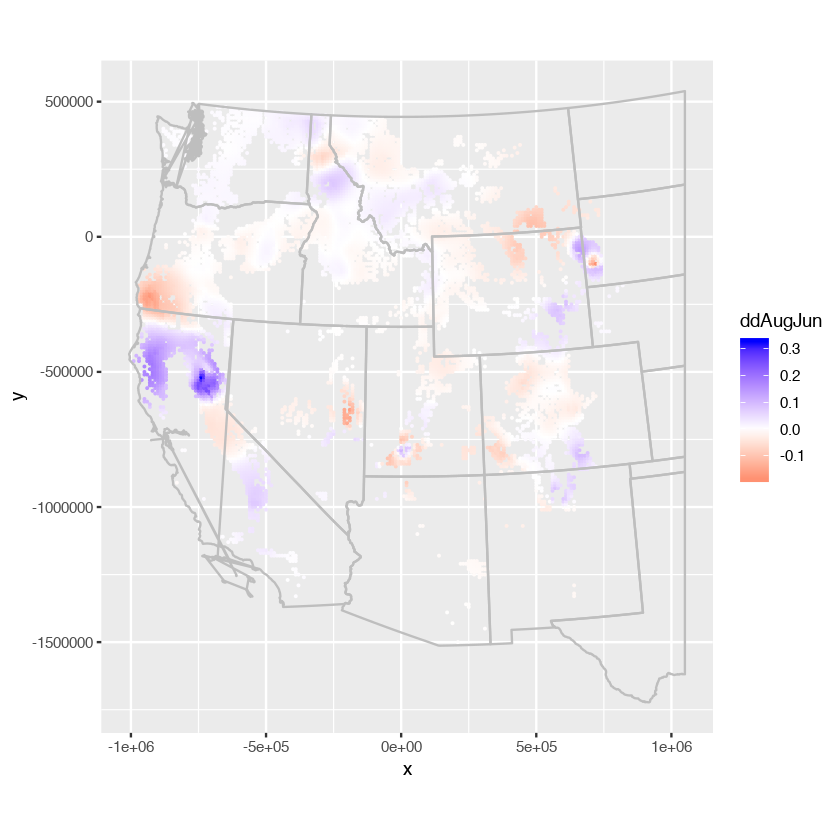

Warning message:
“Non Lab interpolation is deprecated”

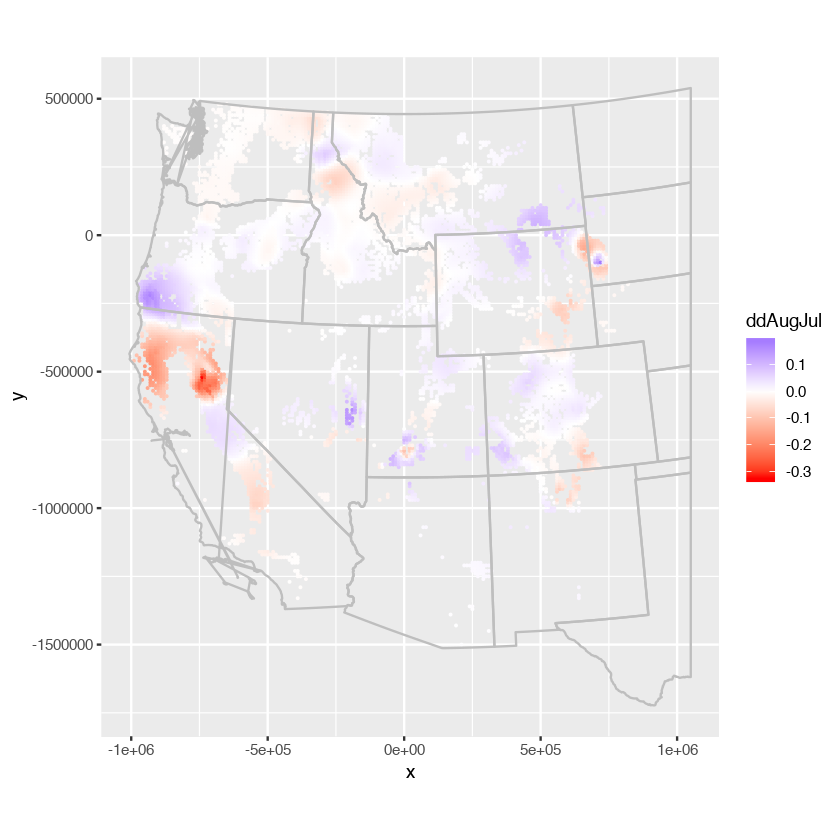

Warning message:
“Non Lab interpolation is deprecated”

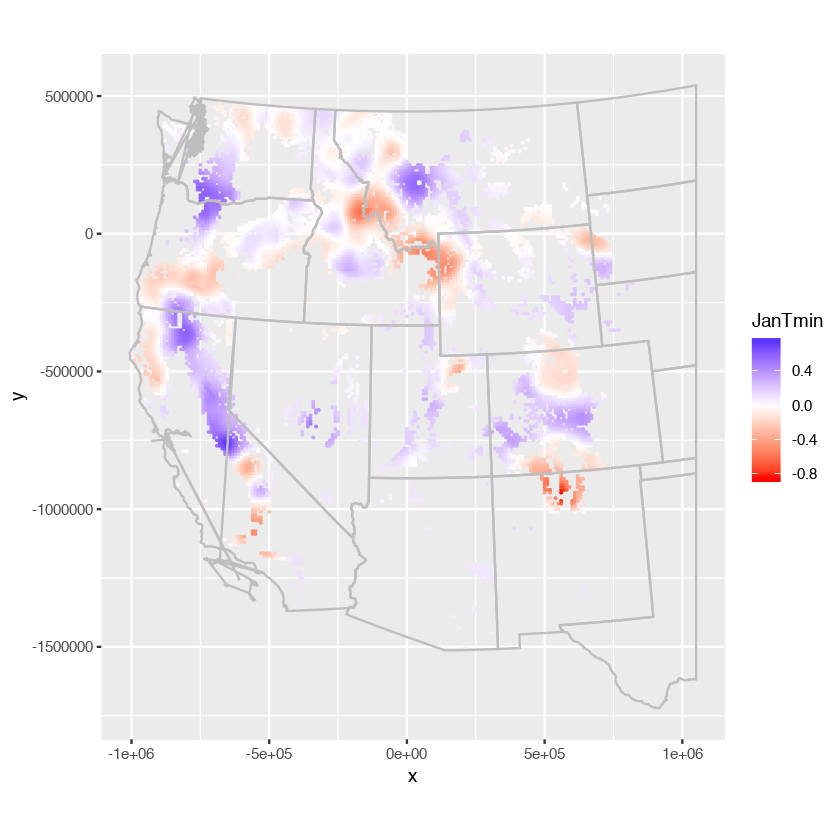

Warning message:
“Non Lab interpolation is deprecated”

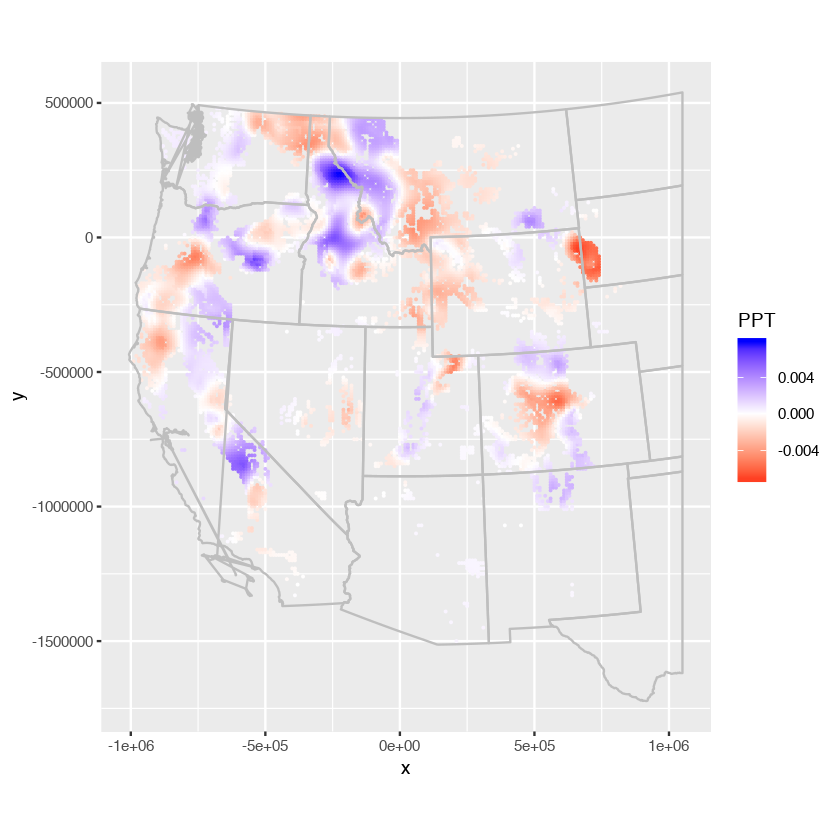

Warning message:
“Non Lab interpolation is deprecated”

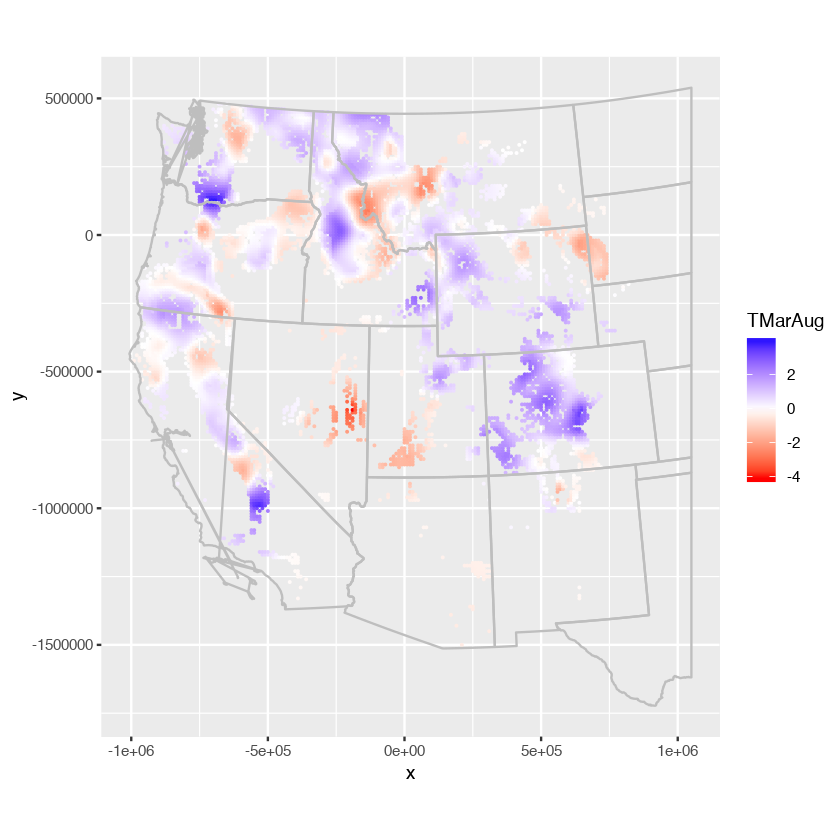

Warning message:
“Non Lab interpolation is deprecated”

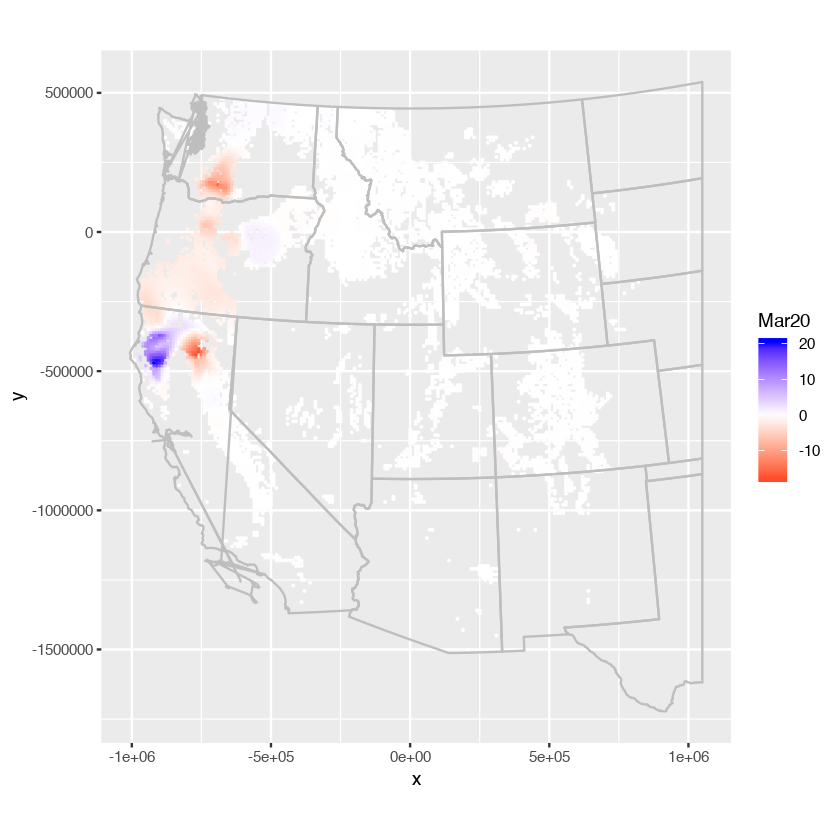

Warning message:
“Non Lab interpolation is deprecated”

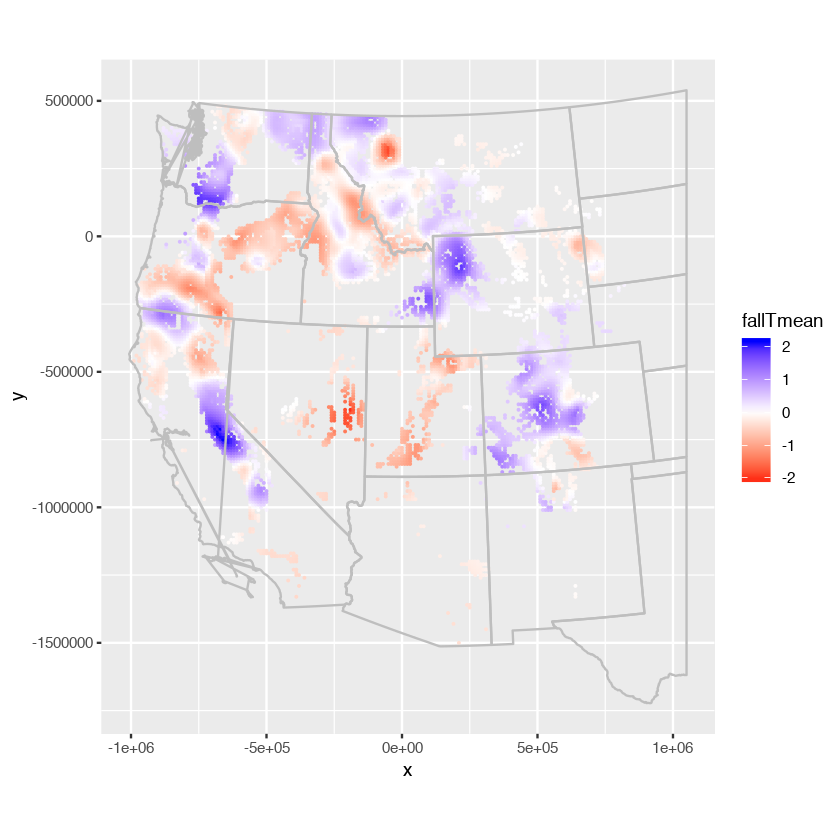

Warning message:
“Non Lab interpolation is deprecated”

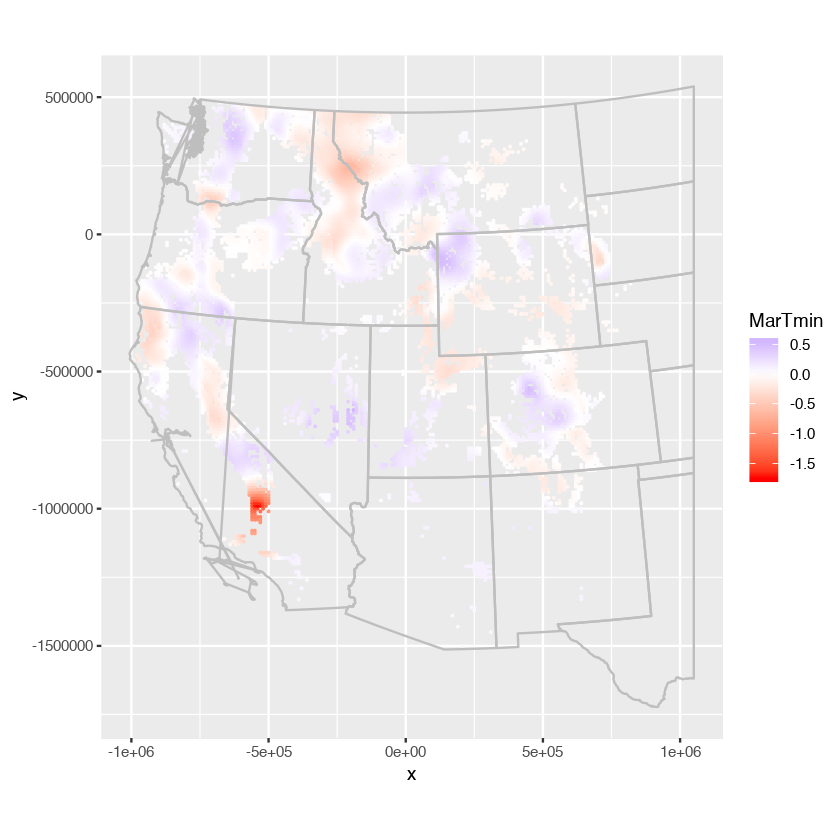

Warning message:
“Non Lab interpolation is deprecated”

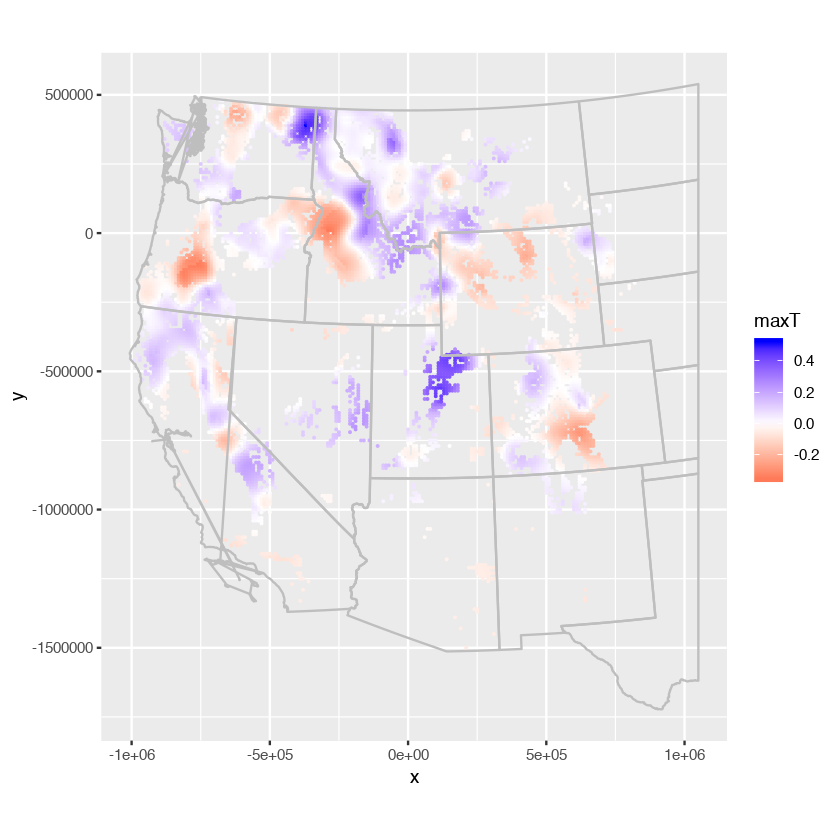

Warning message:
“Non Lab interpolation is deprecated”

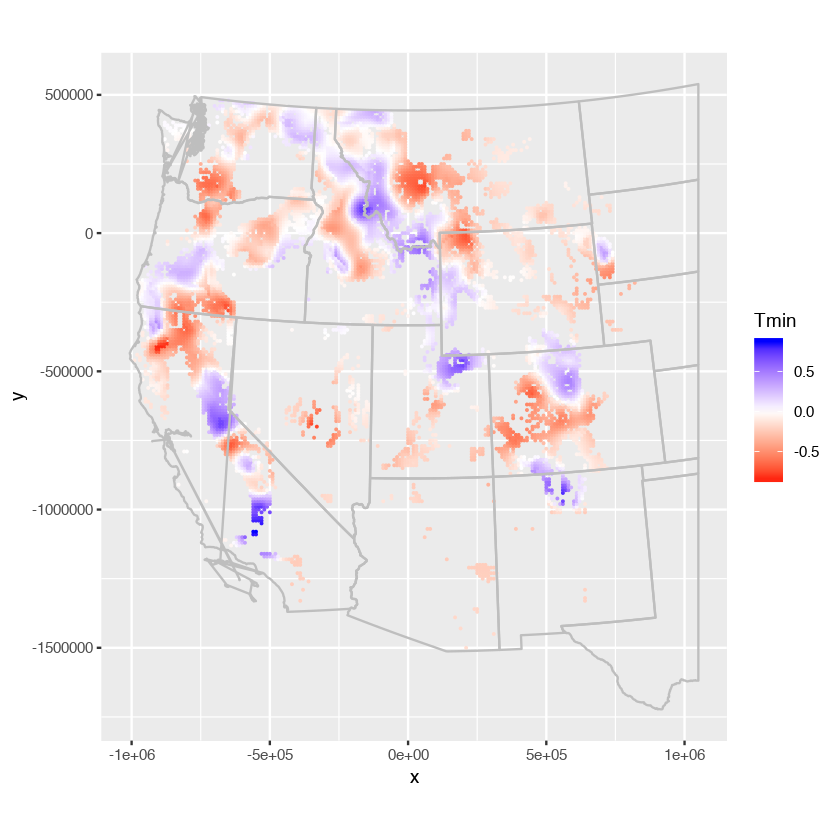

Warning message:
“Non Lab interpolation is deprecated”

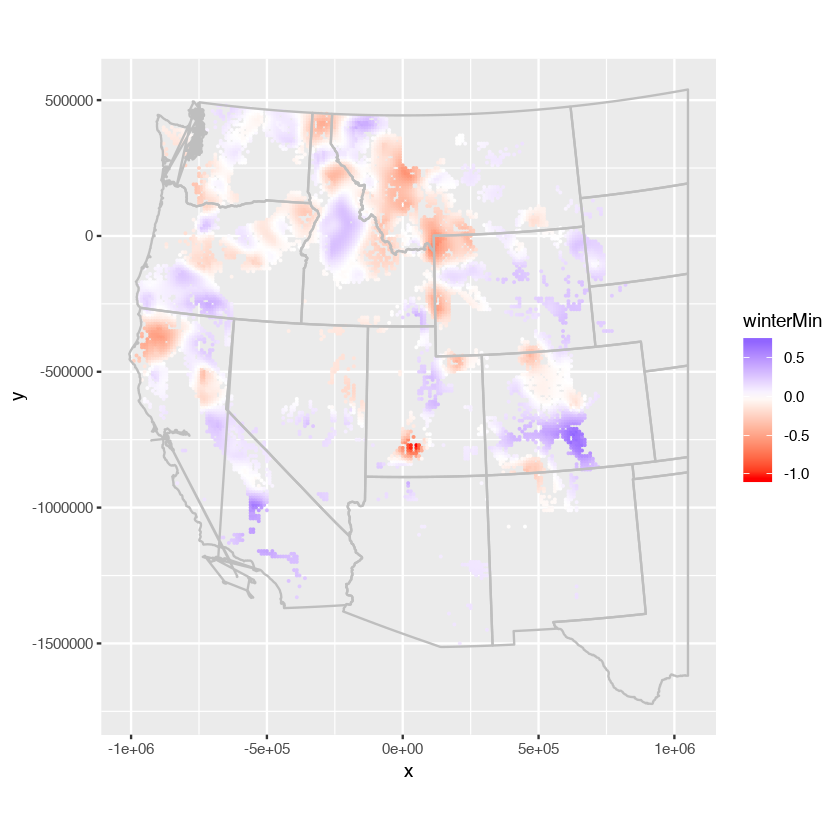

Warning message:
“Non Lab interpolation is deprecated”

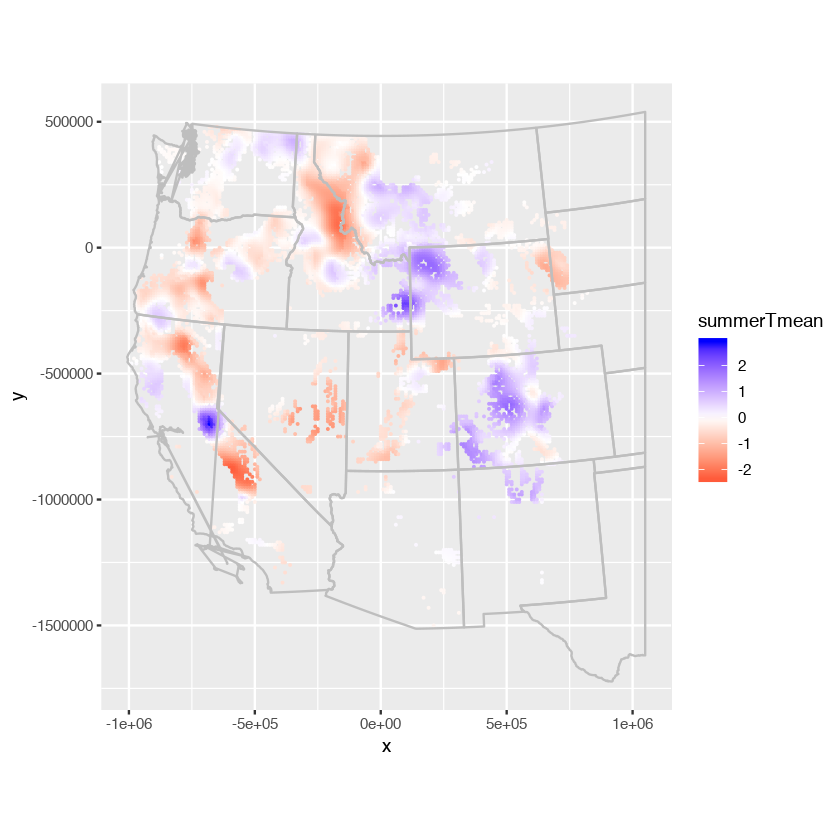

Warning message:
“Non Lab interpolation is deprecated”

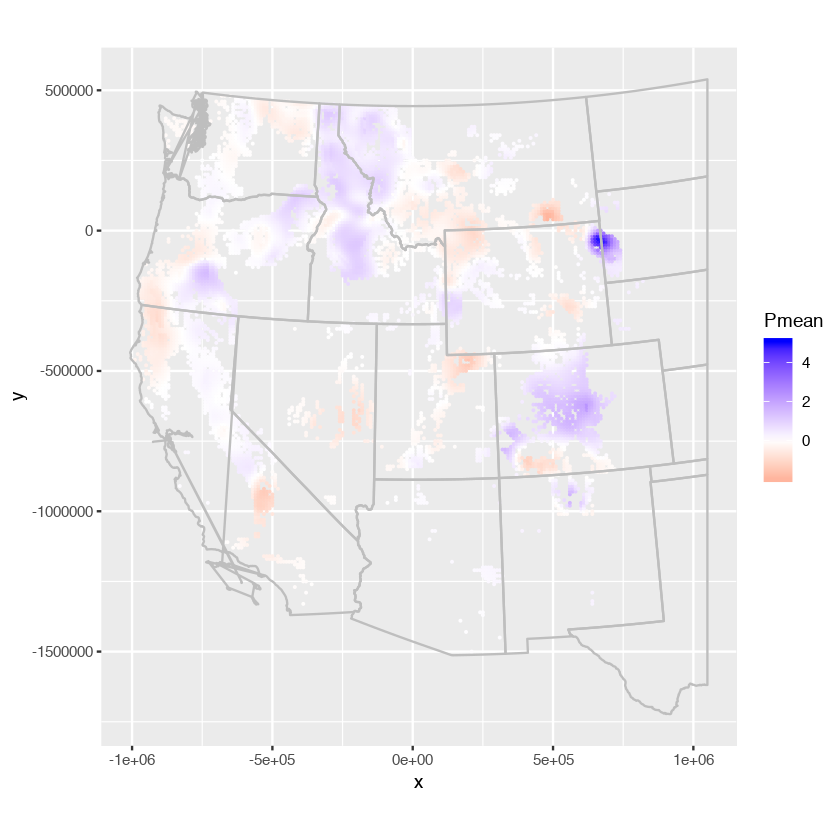

Warning message:
“Non Lab interpolation is deprecated”

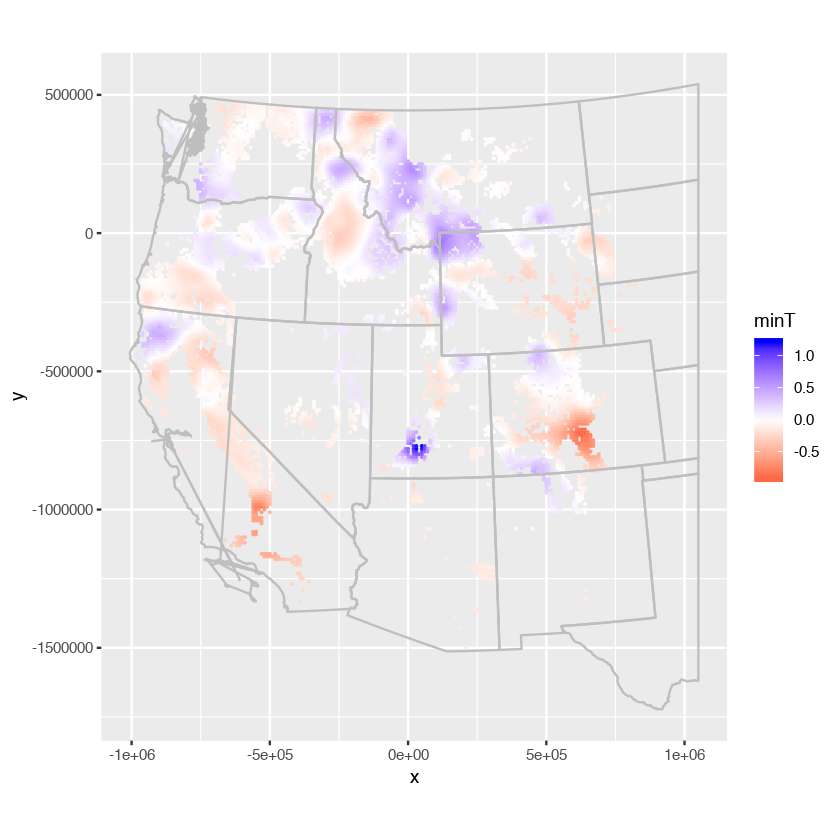

Warning message:
“Non Lab interpolation is deprecated”

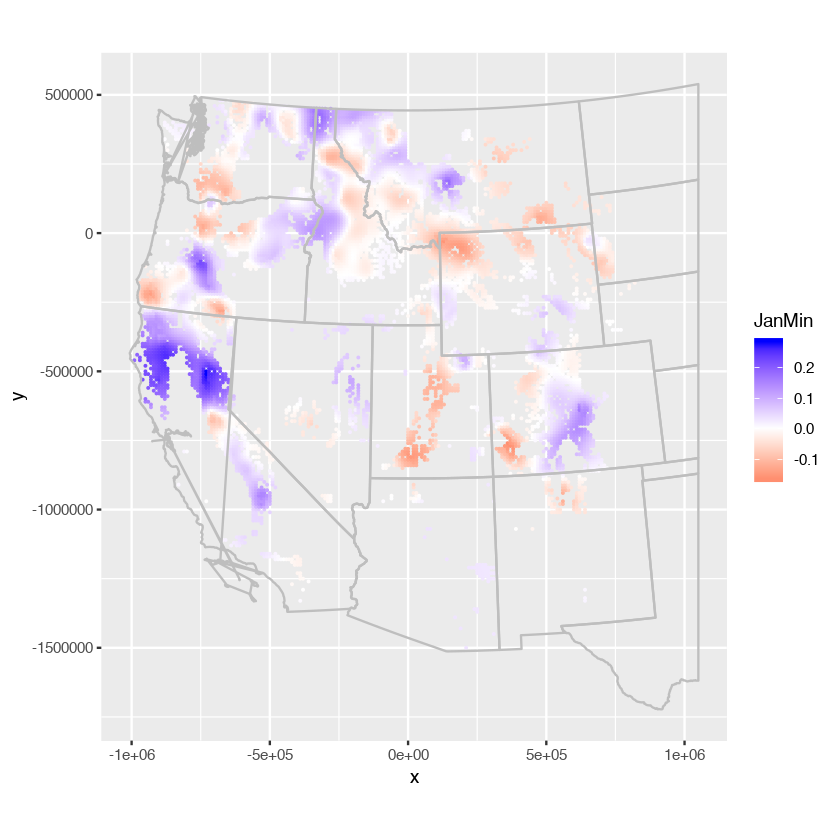

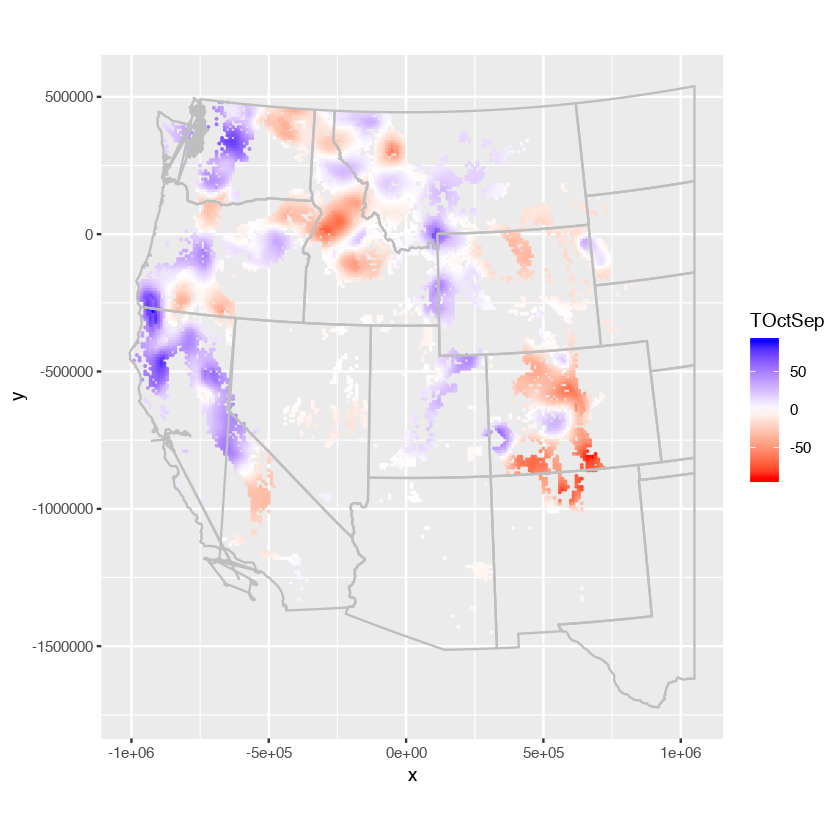

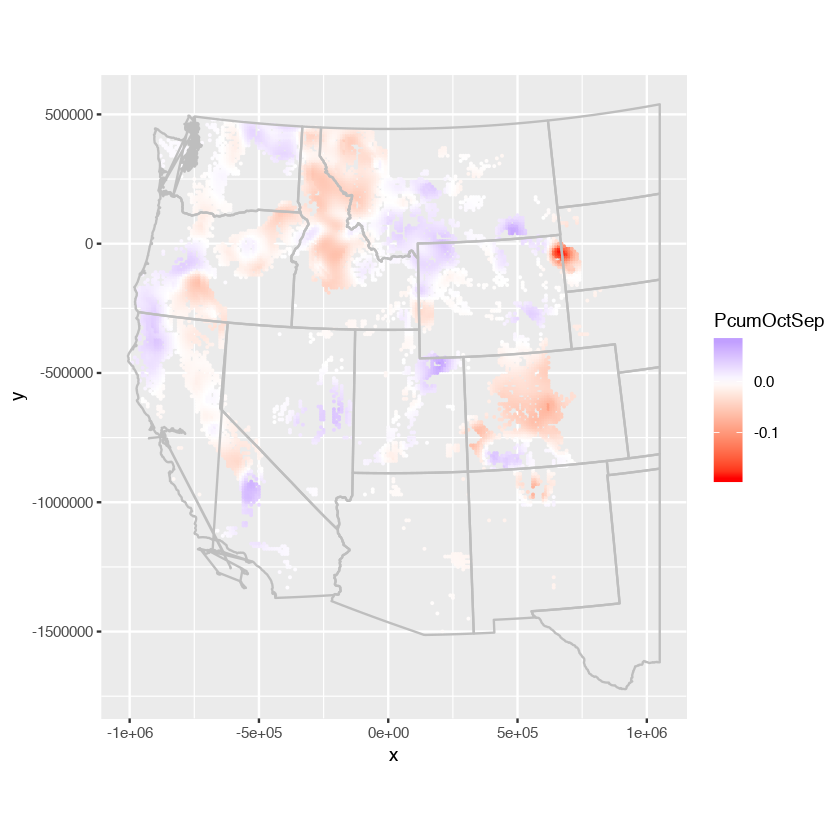

In [232]:
par(mfrow=c(1, 1))
for(v in coef.vars){
    gwr.pt <- ggplot(data.gwr, aes(x=x,y=y))+geom_point(aes(colour=results[,v]), size=0.05)+
  scale_colour_gradient2(low = "red", mid = "white", high = "blue", midpoint = 0, space = "rgb", 
                         na.value = "grey50", guide = "colourbar", guide_legend(title=v))
    print(gwr.pt+geom_path(data=mpb10km_lines,aes(long, lat, group=id), colour="grey")+coord_equal())
}

In [256]:
plotvar <- fit$cluster
class <- classIntervals(plotvar, nclr, style="equal")
colcode <- findColours(class, plotclr)

Warning message in classIntervals(plotvar, nclr, style = "equal"):
“n same as number of different finite values\neach different finite value is a separate class”

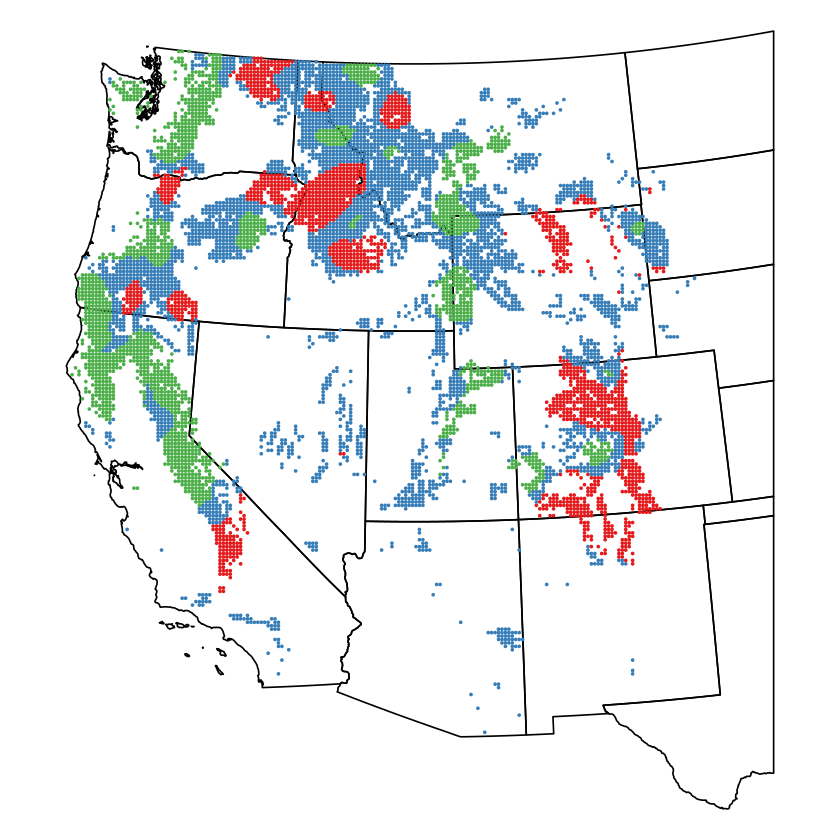

In [257]:
par(mfrow=c(1,1),mar=c(0,0,0,0))
plot(mpb10km_poly)
points(xy$x, xy$y, pch=16, col=colcode, cex=0.3)

In [258]:
vars <- sample(colnames(coeffs)[!(colnames(coeffs) %in% c('host', 'forest'))],16)
vars

[1] "Tmin"        "TMarAug"     "Pmean"       "vcc"         "lat"        
 [6] "MarMin"      "Tmean"       "maxT"        "summerP0"    "fallTmean"  
[11] "cwd"         "TOctSep"     "GAP3"        "wd"          "density"    
[16] "summerTmean"

In [260]:
coeffs.updated <- data.frame(coeffs, fit$cluster)

In [261]:
data.updated <- data.frame(data, fit$cluster)

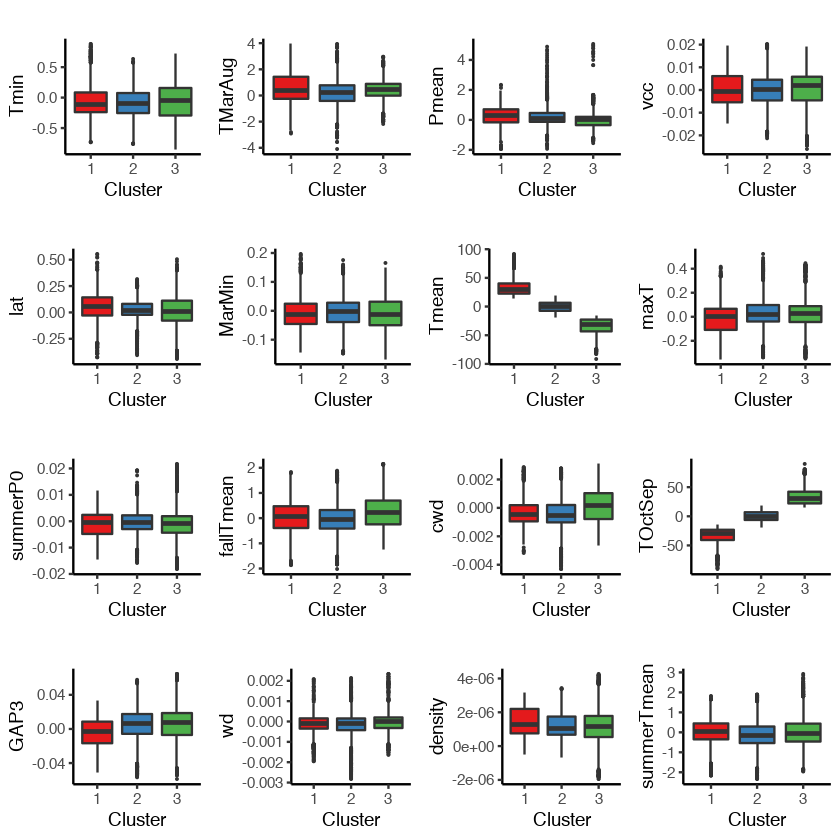

In [262]:
vplayout <- function(x, y) viewport(layout.pos.row = x, layout.pos.col = y)
n1 <- c(rep(1,4),rep(2,4),rep(3,4),rep(4,4)); n2 <- rep(c(1,2,3,4),4) 
grid.newpage()
pushViewport(viewport(layout = grid.layout(4, 4)))
for(v in vars){
    sdf <- coeffs.updated[, c(v, 'fit.cluster')]
    colnames(sdf)[1] <- 'var'
    g <- ggplot(sdf, aes(x=as.factor(fit.cluster), y=var, fill=as.factor(fit.cluster)))+
      scale_fill_manual(values = plotclr) +
      geom_boxplot(outlier.size = 0.05)+labs(title='', x="Cluster", y = v)+
      theme_classic() + theme(legend.position="none") 
    i <- which(vars==v)
    print(g, vp = vplayout(n1[i], n2[i]))
}

In [21]:
spdf <- SpatialPointsDataFrame(data.gwr[,c("x", "y")], data.gwr)

In [226]:
localstats1 <- gwss(spdf, vars = c("beetleAcres", "mStdAge"), bw=500000)
head(data.frame(localstats1$SDF))

beetleAcres_LM,mStdAge_LM,beetleAcres_LSD,mStdAge_LSD,beetleAcres_LVar,mStdAge_LVar,beetleAcres_LSKe,mStdAge_LSKe,beetleAcres_LCV,mStdAge_LCV,Cov_beetleAcres.mStdAge,Corr_beetleAcres.mStdAge,Spearman_rho_beetleAcres.mStdAge,x,y,optional
191.1481,100.6004,473.4072,49.99307,224114.4,2499.307,6.744896,1.280415,2.476651,0.4969471,1008.2457,0.04255628,0.1612211,-990000,-460000,TRUE
198.3667,100.4704,493.6407,50.12435,243681.1,2512.450,6.556837,1.297154,2.488525,0.4988967,970.5130,0.03918333,0.1520479,-980000,-440000,TRUE
200.8600,100.5165,490.2160,49.90351,240311.8,2490.360,6.500783,1.302274,2.440585,0.4964706,1023.6050,0.04179984,0.1577063,-970000,-460000,TRUE
201.9140,100.4682,495.8820,49.98804,245899.0,2498.804,6.475848,1.304929,2.455907,0.4975511,999.3319,0.04027449,0.1539519,-970000,-450000,TRUE
236.1679,100.4243,598.6117,52.66263,358335.9,2773.353,5.466804,1.374200,2.534687,0.5244014,1329.9806,0.04214881,0.1110008,-970000,-240000,TRUE
237.5975,100.4237,601.7286,52.79552,362077.3,2787.366,5.426110,1.378045,2.532554,0.5257277,1374.8313,0.04323533,0.1103121,-970000,-230000,TRUE


In [24]:
quick.map <- function(spdf,var,legend.title,main.title) {
  x <- spdf@data[,var]
  cut.vals <- pretty(x)
  x.cut <- cut(x,cut.vals)
  cut.levels <- levels(x.cut)
  cut.band <- match(x.cut,cut.levels)
  colors <- brewer.pal(length(cut.levels),'Reds')
  par(mar=c(1,1,1,1))
  plot(mpb10km_poly,col='grey85')
  title(main.title)
  plot(spdf,add=TRUE,col=colors[cut.band],pch=16, cex=0.3)
  legend('bottomleft',cut.levels,col=colors,pch=16,bty='n',title=legend.title)
}

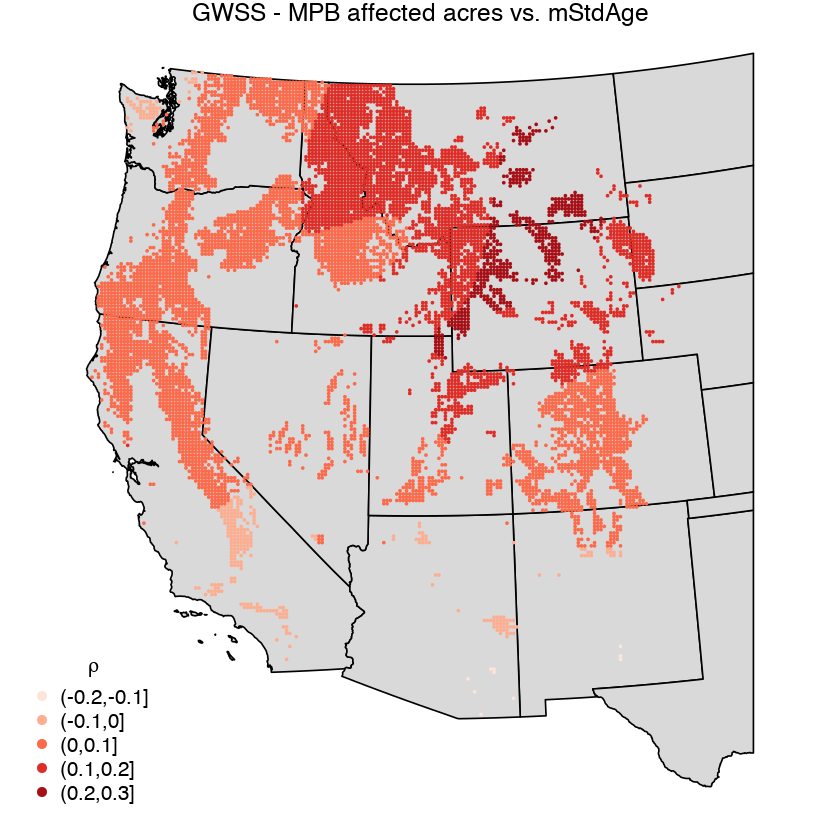

In [227]:
quick.map(localstats1$SDF,"Corr_beetleAcres.mStdAge",
          expression(rho),"GWSS - MPB affected acres vs. mStdAge")

In [26]:
localstats2 <- gwss(spdf, vars = c("beetleAcres", "density"), bw=500000)
head(data.frame(localstats2$SDF))

beetleAcres_LM,density_LM,beetleAcres_LSD,density_LSD,beetleAcres_LVar,density_LVar,beetleAcres_LSKe,density_LSKe,beetleAcres_LCV,density_LCV,Cov_beetleAcres.density,Corr_beetleAcres.density,Spearman_rho_beetleAcres.density,x,y,optional
191.1481,42046.63,473.4072,9648.436,224114.4,93092313,6.744896,-1.808546,2.476651,0.2294699,-364453.1,-0.07970615,-0.1644176,-990000,-460000,TRUE
198.3667,41873.42,493.6407,9887.655,243681.1,97765716,6.556837,-1.769355,2.488525,0.2361320,-413730.3,-0.08467842,-0.1768543,-980000,-440000,TRUE
200.8600,41763.13,490.2160,9872.028,240311.8,97456937,6.500783,-1.758556,2.440585,0.2363814,-378654.9,-0.07816466,-0.1658030,-970000,-460000,TRUE
201.9140,41749.83,495.8820,9932.217,245899.0,98648932,6.475848,-1.752311,2.455907,0.2378984,-399486.6,-0.08102936,-0.1715405,-970000,-450000,TRUE
236.1679,41378.97,598.6117,11499.629,358335.9,132241471,5.466804,-1.535385,2.534687,0.2779100,-595548.9,-0.08643233,-0.2466103,-970000,-240000,TRUE
237.5975,41365.86,601.7286,11591.641,362077.3,134366147,5.426110,-1.521875,2.532554,0.2802224,-592845.6,-0.08491473,-0.2474270,-970000,-230000,TRUE


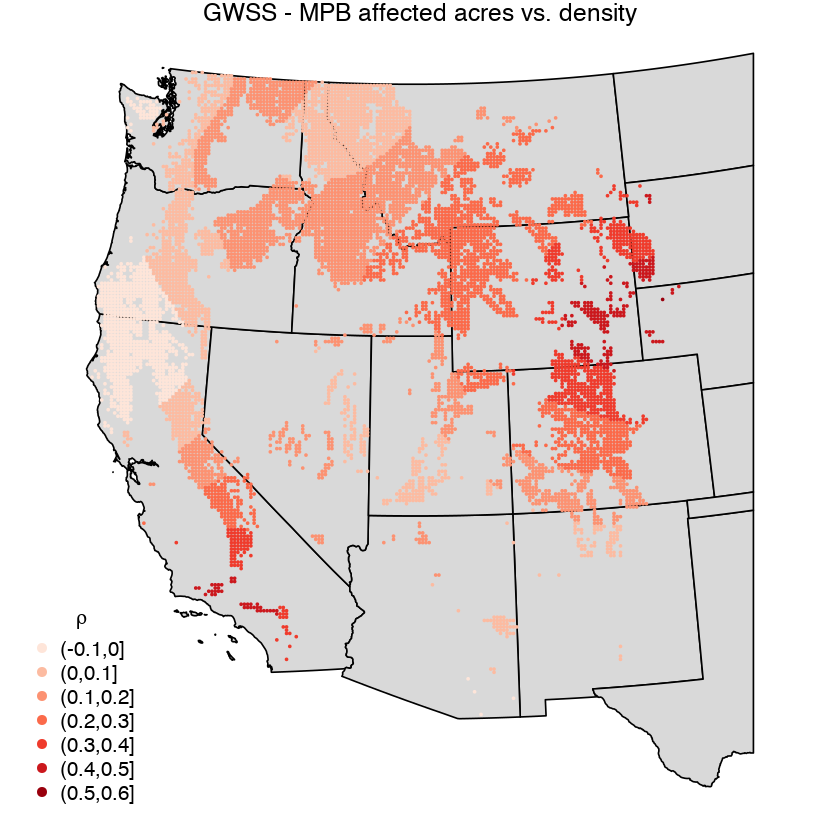

In [222]:
quick.map(localstats2$SDF,"Corr_beetleAcres.density",
          expression(rho),"GWSS - MPB affected acres vs. density")

In [29]:
localstats3 <- gwss(spdf, vars = c("beetleAcres", "Tmean"), bw=500000)
head(data.frame(localstats3$SDF))

beetleAcres_LM,Tmean_LM,beetleAcres_LSD,Tmean_LSD,beetleAcres_LVar,Tmean_LVar,beetleAcres_LSKe,Tmean_LSKe,beetleAcres_LCV,Tmean_LCV,Cov_beetleAcres.Tmean,Corr_beetleAcres.Tmean,Spearman_rho_beetleAcres.Tmean,x,y,optional
191.1481,9.400169,473.4072,2.063510,224114.4,4.258075,6.744896,0.318837308,2.476651,0.2195184,-280.9047,-0.2872496,-0.4744708,-990000,-460000,TRUE
198.3667,9.315616,493.6407,2.072731,243681.1,4.296212,6.556837,0.283276805,2.488525,0.2225007,-310.0525,-0.3027200,-0.4873089,-980000,-440000,TRUE
200.8600,9.358955,490.2160,2.094776,240311.8,4.388086,6.500783,0.330540869,2.440585,0.2238258,-294.7613,-0.2867519,-0.4754170,-970000,-460000,TRUE
201.9140,9.326928,495.8820,2.090893,245899.0,4.371833,6.475848,0.311157083,2.455907,0.2241781,-306.0330,-0.2948648,-0.4817519,-970000,-450000,TRUE
236.1679,8.691368,598.6117,2.060644,358335.9,4.246256,5.466804,-0.008077616,2.534687,0.2370909,-469.0365,-0.3798798,-0.5803252,-970000,-240000,TRUE
237.5975,8.663335,601.7286,2.059952,362077.3,4.243403,5.426110,-0.013770887,2.532554,0.2377782,-473.4212,-0.3815724,-0.5841577,-970000,-230000,TRUE


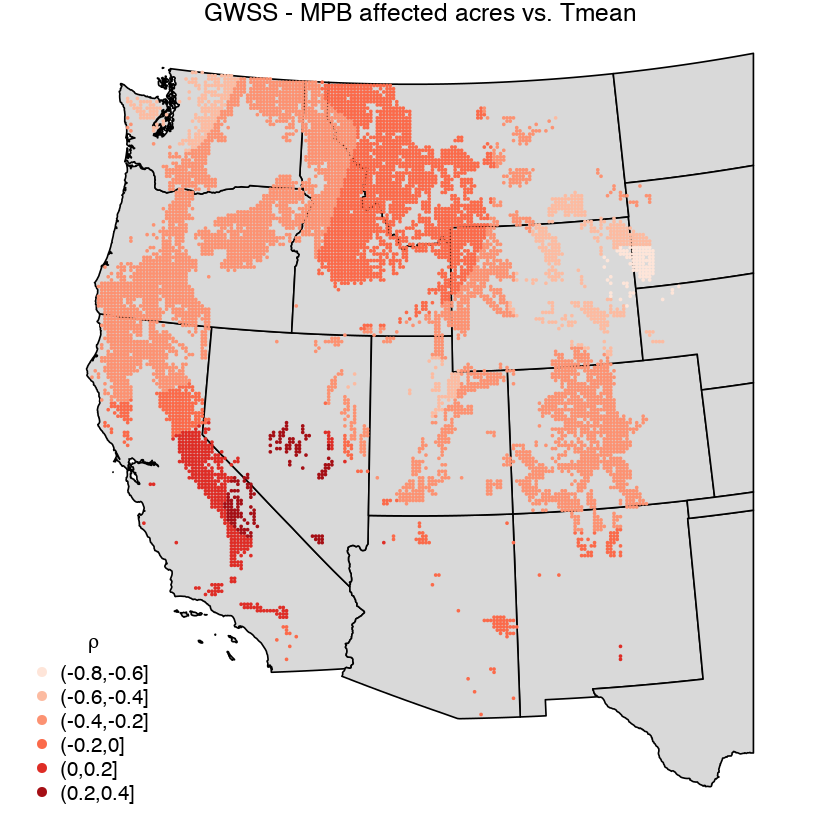

In [221]:
quick.map(localstats3$SDF,"Corr_beetleAcres.Tmean",
          expression(rho),"GWSS - MPB affected acres vs. Tmean")

In [31]:
localstats4 <- gwss(spdf, vars = c("beetleAcres", "Pmean"), bw=500000)
head(data.frame(localstats4$SDF))

beetleAcres_LM,Pmean_LM,beetleAcres_LSD,Pmean_LSD,beetleAcres_LVar,Pmean_LVar,beetleAcres_LSKe,Pmean_LSKe,beetleAcres_LCV,Pmean_LCV,Cov_beetleAcres.Pmean,Corr_beetleAcres.Pmean,Spearman_rho_beetleAcres.Pmean,x,y,optional
191.1481,92.03951,473.4072,22.91797,224114.4,525.2335,6.744896,-0.5575870,2.476651,0.2490015,-2305.793,-0.2123006,-0.2235875,-990000,-460000,TRUE
198.3667,91.23350,493.6407,23.47529,243681.1,551.0893,6.556837,-0.5342460,2.488525,0.2573100,-2549.759,-0.2198047,-0.2408348,-980000,-440000,TRUE
200.8600,91.14330,490.2160,23.28719,240311.8,542.2930,6.500783,-0.5397898,2.440585,0.2555008,-2463.909,-0.2156160,-0.2286012,-970000,-460000,TRUE
201.9140,90.97243,495.8820,23.46981,245899.0,550.8318,6.475848,-0.5327551,2.455907,0.2579881,-2544.318,-0.2183978,-0.2358231,-970000,-450000,TRUE
236.1679,88.27157,598.6117,28.02343,358335.9,785.3128,5.466804,-0.2091429,2.534687,0.3174684,-3328.350,-0.1982213,-0.2867186,-970000,-240000,TRUE
237.5975,88.23486,601.7286,28.33941,362077.3,803.1220,5.426110,-0.1797454,2.532554,0.3211815,-3317.807,-0.1943778,-0.2852075,-970000,-230000,TRUE


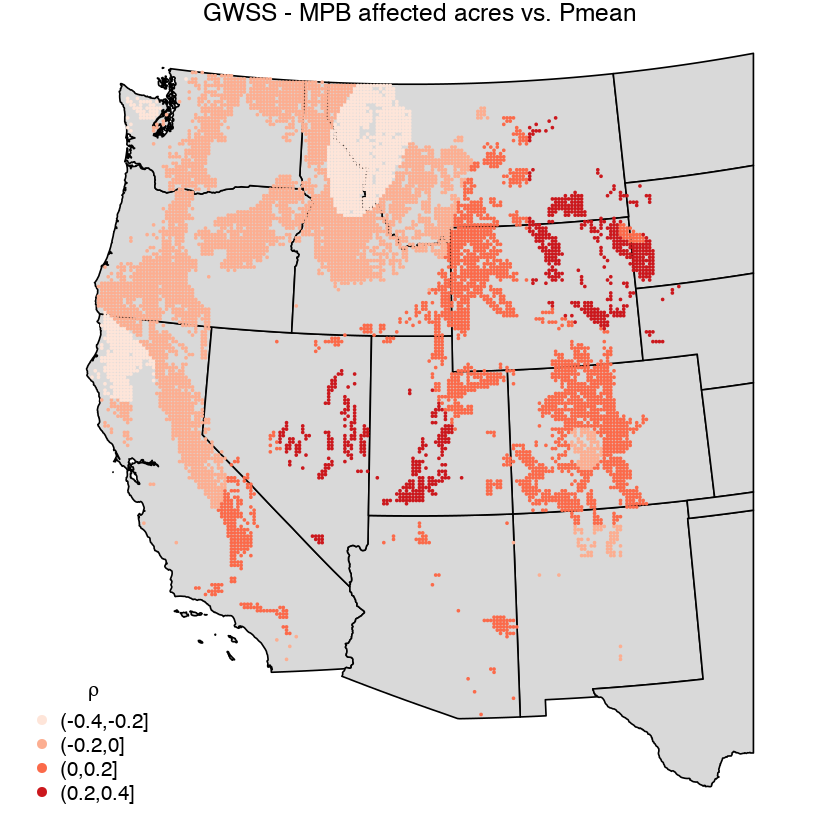

In [220]:
quick.map(localstats4$SDF,"Corr_beetleAcres.Pmean",
          expression(rho),"GWSS - MPB affected acres vs. Pmean")

In [33]:
localstats5 <- gwss(spdf, vars = c("beetleAcres", "vcc"), bw=500000)
head(data.frame(localstats5$SDF))

beetleAcres_LM,vcc_LM,beetleAcres_LSD,vcc_LSD,beetleAcres_LVar,vcc_LVar,beetleAcres_LSKe,vcc_LSKe,beetleAcres_LCV,vcc_LCV,Cov_beetleAcres.vcc,Corr_beetleAcres.vcc,Spearman_rho_beetleAcres.vcc,x,y,optional
191.1481,2.464272,473.4072,0.8506649,224114.4,0.7236308,6.744896,0.9175521,2.476651,0.3451993,66.21622,0.1642529,0.1769265,-990000,-460000,TRUE
198.3667,2.490589,493.6407,0.8601994,243681.1,0.7399429,6.556837,0.8937948,2.488525,0.3453799,71.41333,0.1680076,0.1795674,-980000,-440000,TRUE
200.8600,2.482567,490.2160,0.8511295,240311.8,0.7244214,6.500783,0.9115448,2.440585,0.3428426,69.96642,0.1675203,0.1812118,-970000,-460000,TRUE
201.9140,2.490898,495.8820,0.8557773,245899.0,0.7323547,6.475848,0.9015127,2.455907,0.3435618,71.62198,0.1686056,0.1814786,-970000,-450000,TRUE
236.1679,2.683303,598.6117,0.9417062,358335.9,0.8868105,5.466804,0.7386405,2.534687,0.3509504,79.85219,0.1415188,0.1547038,-970000,-240000,TRUE
237.5975,2.693592,601.7286,0.9453063,362077.3,0.8936040,5.426110,0.7319560,2.532554,0.3509464,78.69706,0.1382205,0.1514045,-970000,-230000,TRUE


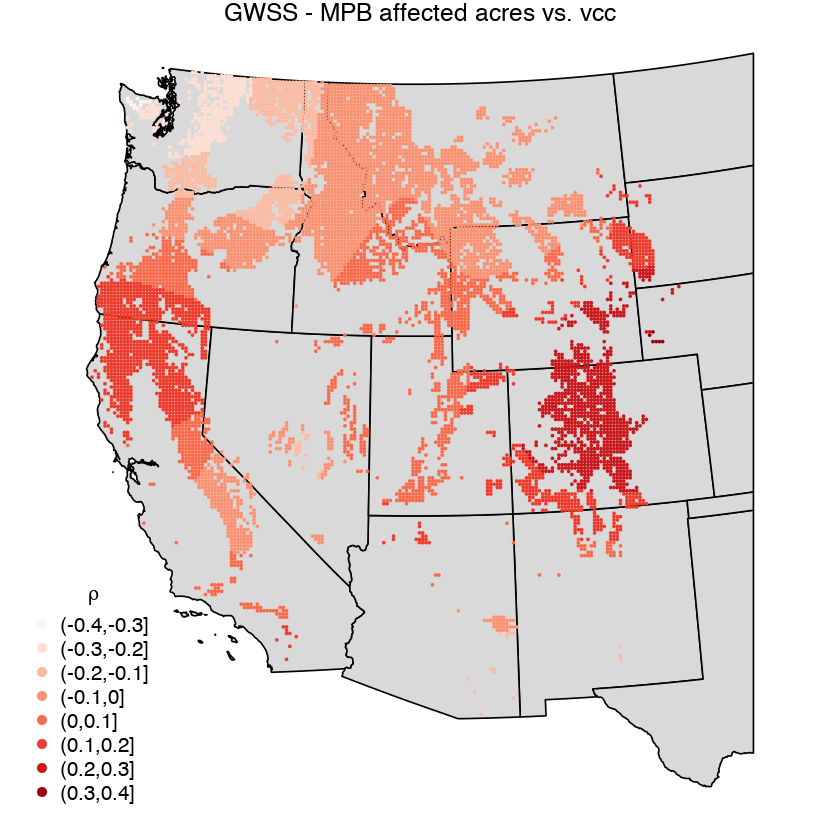

In [219]:
quick.map(localstats5$SDF,"Corr_beetleAcres.vcc",
          expression(rho),"GWSS - MPB affected acres vs. vcc")

In [35]:
localstats6 <- gwss(spdf, vars = c("beetleAcres", "prs"), bw=500000)
head(data.frame(localstats6$SDF))

beetleAcres_LM,prs_LM,beetleAcres_LSD,prs_LSD,beetleAcres_LVar,prs_LVar,beetleAcres_LSKe,prs_LSKe,beetleAcres_LCV,prs_LCV,Cov_beetleAcres.prs,Corr_beetleAcres.prs,Spearman_rho_beetleAcres.prs,x,y,optional
191.1481,3.145038,473.4072,4.673809,224114.4,21.84449,6.744896,2.812045,2.476651,1.486090,195.8731,0.08843232,0.1850594,-990000,-460000,TRUE
198.3667,3.253565,493.6407,4.800995,243681.1,23.04955,6.556837,2.700584,2.488525,1.475610,227.9259,0.09607517,0.1908296,-980000,-440000,TRUE
200.8600,3.233497,490.2160,4.745269,240311.8,22.51757,6.500783,2.738811,2.440585,1.467534,210.5826,0.09043468,0.1889632,-970000,-460000,TRUE
201.9140,3.264739,495.8820,4.790383,245899.0,22.94777,6.475848,2.702590,2.455907,1.467310,222.7835,0.09369126,0.1907673,-970000,-450000,TRUE
236.1679,4.351683,598.6117,5.887190,358335.9,34.65901,5.466804,1.871959,2.534687,1.352854,436.4859,0.12373847,0.2040523,-970000,-240000,TRUE
237.5975,4.422788,601.7286,5.939558,362077.3,35.27835,5.426110,1.834099,2.532554,1.342944,441.8781,0.12351927,0.2033942,-970000,-230000,TRUE


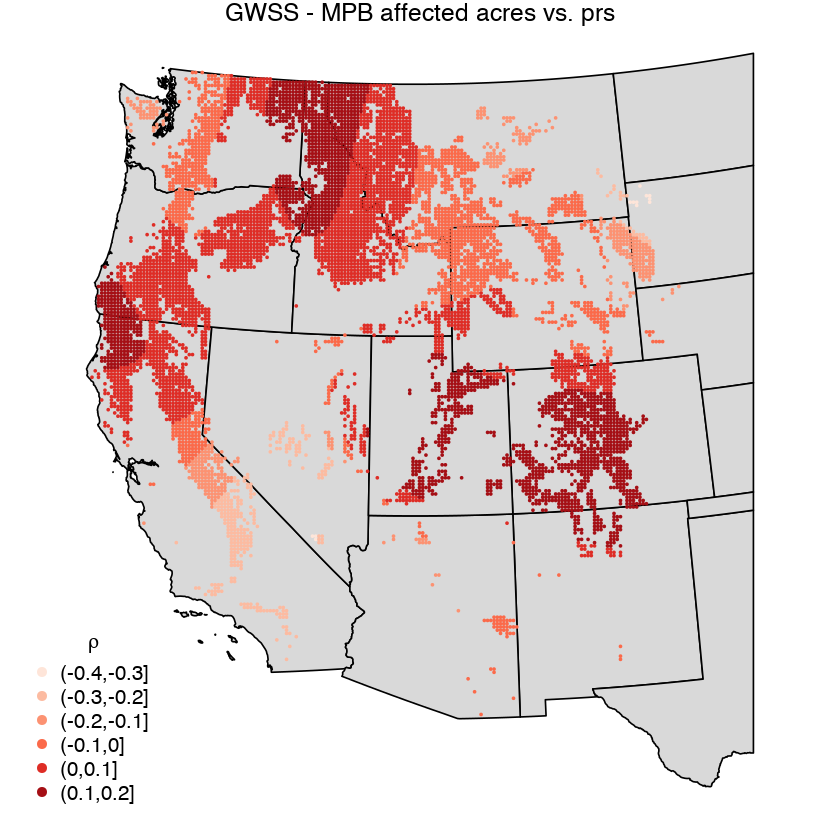

In [218]:
quick.map(localstats6$SDF,"Corr_beetleAcres.prs",
          expression(rho),"GWSS - MPB affected acres vs. prs")

In [37]:
localstats7 <- gwss(spdf, vars = c("beetleAcres", "summerP0"), bw=500000)
head(data.frame(localstats7$SDF))

beetleAcres_LM,summerP0_LM,beetleAcres_LSD,summerP0_LSD,beetleAcres_LVar,summerP0_LVar,beetleAcres_LSKe,summerP0_LSKe,beetleAcres_LCV,summerP0_LCV,Cov_beetleAcres.summerP0,Corr_beetleAcres.summerP0,Spearman_rho_beetleAcres.summerP0,x,y,optional
191.1481,36.56396,473.4072,11.58538,224114.4,134.2211,6.744896,0.5529244,2.476651,0.3168525,831.5812,0.1514612,0.1741786,-990000,-460000,TRUE
198.3667,37.41331,493.6407,11.97089,243681.1,143.3023,6.556837,0.6574587,2.488525,0.3199635,930.3807,0.1572834,0.1689632,-980000,-440000,TRUE
200.8600,36.60708,490.2160,11.76828,240311.8,138.4925,6.500783,0.5866666,2.440585,0.3214756,873.9523,0.1513380,0.1701569,-970000,-460000,TRUE
201.9140,37.02166,495.8820,11.91615,245899.0,141.9946,6.475848,0.6297254,2.455907,0.3218696,914.1431,0.1545485,0.1687112,-970000,-450000,TRUE
236.1679,46.01129,598.6117,15.51864,358335.9,240.8283,5.466804,1.3647194,2.534687,0.3372791,1418.4323,0.1525448,0.1282977,-970000,-240000,TRUE
237.5975,46.48648,601.7286,15.76288,362077.3,248.4684,5.426110,1.3992414,2.532554,0.3390853,1424.0702,0.1499969,0.1256600,-970000,-230000,TRUE


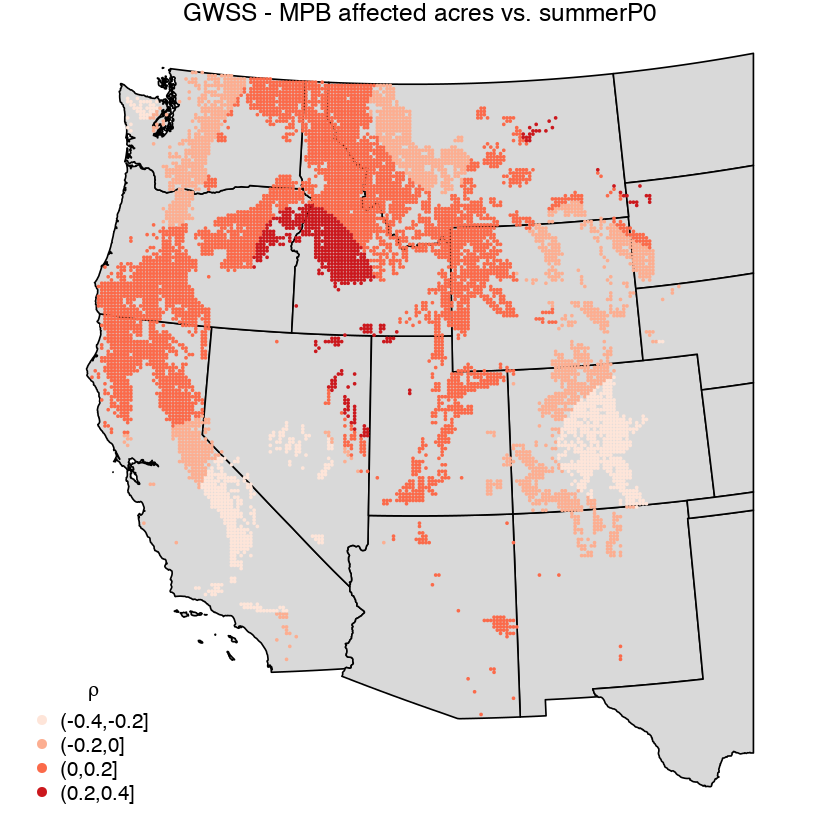

In [217]:
quick.map(localstats7$SDF,"Corr_beetleAcres.summerP0",
          expression(rho),"GWSS - MPB affected acres vs. summerP0")

In [39]:
localstats8 <- gwss(spdf, vars = c("beetleAcres", "PcumOctSep"), bw=500000)
head(data.frame(localstats8$SDF))

beetleAcres_LM,PcumOctSep_LM,beetleAcres_LSD,PcumOctSep_LSD,beetleAcres_LVar,PcumOctSep_LVar,beetleAcres_LSKe,PcumOctSep_LSKe,beetleAcres_LCV,PcumOctSep_LCV,Cov_beetleAcres.PcumOctSep,Corr_beetleAcres.PcumOctSep,Spearman_rho_beetleAcres.PcumOctSep,x,y,optional
191.1481,2238.442,473.4072,556.6890,224114.4,309902.6,6.744896,-0.5711002,2.476651,0.2486948,-55976.78,-0.2121790,-0.2241817,-990000,-460000,TRUE
198.3667,2218.289,493.6407,570.2437,243681.1,325177.9,6.556837,-0.5468065,2.488525,0.2570647,-61961.24,-0.2198914,-0.2414395,-980000,-440000,TRUE
200.8600,2216.847,490.2160,565.7481,240311.8,320070.9,6.500783,-0.5531158,2.440585,0.2552039,-59837.59,-0.2155382,-0.2292505,-970000,-460000,TRUE
201.9140,2212.361,495.8820,570.1712,245899.0,325095.2,6.475848,-0.5456574,2.455907,0.2577206,-61816.11,-0.2184152,-0.2364626,-970000,-450000,TRUE
236.1679,2140.449,598.6117,678.5942,358335.9,460490.0,5.466804,-0.2201744,2.534687,0.3170335,-81058.61,-0.1993571,-0.2866614,-970000,-240000,TRUE
237.5975,2139.285,601.7286,686.0986,362077.3,470731.3,5.426110,-0.1908114,2.532554,0.3207140,-80799.84,-0.1955286,-0.2851250,-970000,-230000,TRUE


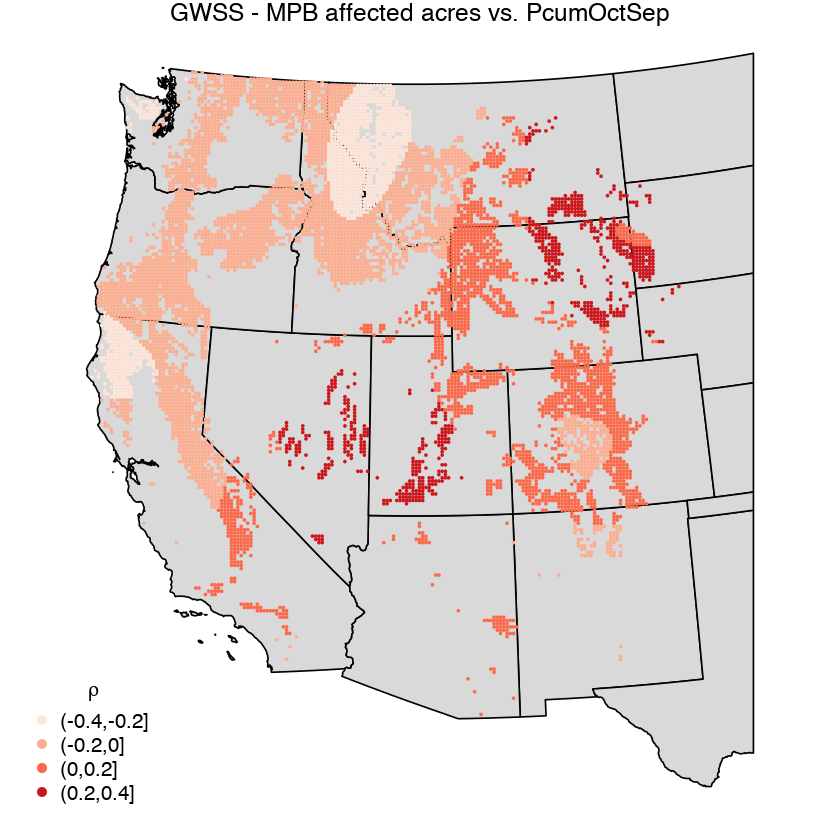

In [216]:
quick.map(localstats8$SDF,"Corr_beetleAcres.PcumOctSep",
          expression(rho),"GWSS - MPB affected acres vs. PcumOctSep")

In [41]:
localstats9 <- gwss(spdf, vars = c("beetleAcres", "PPT"), bw=500000)
head(data.frame(localstats9$SDF))

beetleAcres_LM,PPT_LM,beetleAcres_LSD,PPT_LSD,beetleAcres_LVar,PPT_LVar,beetleAcres_LSKe,PPT_LSKe,beetleAcres_LCV,PPT_LCV,Cov_beetleAcres.PPT,Corr_beetleAcres.PPT,Spearman_rho_beetleAcres.PPT,x,y,optional
191.1481,6714.364,473.4072,1690.837,224114.4,2858931,6.744896,-0.6017344,2.476651,0.2518239,-168570.8,-0.2103718,-0.2254250,-990000,-460000,TRUE
198.3667,6646.530,493.6407,1730.730,243681.1,2995428,6.556837,-0.5739919,2.488525,0.2603961,-186972.2,-0.2186233,-0.2424023,-980000,-440000,TRUE
200.8600,6650.258,490.2160,1718.319,240311.8,2952621,6.500783,-0.5823351,2.440585,0.2583838,-180332.4,-0.2138668,-0.2306494,-970000,-460000,TRUE
201.9140,6632.926,495.8820,1731.153,245899.0,2996891,6.475848,-0.5735356,2.455907,0.2609939,-186460.4,-0.2169889,-0.2376750,-970000,-450000,TRUE
236.1679,6341.261,598.6117,2019.680,358335.9,4079106,5.466804,-0.2644264,2.534687,0.3184981,-244753.2,-0.2022500,-0.2829933,-970000,-240000,TRUE
237.5975,6334.136,601.7286,2039.117,362077.3,4158000,5.426110,-0.2378238,2.532554,0.3219251,-243864.7,-0.1985606,-0.2813106,-970000,-230000,TRUE


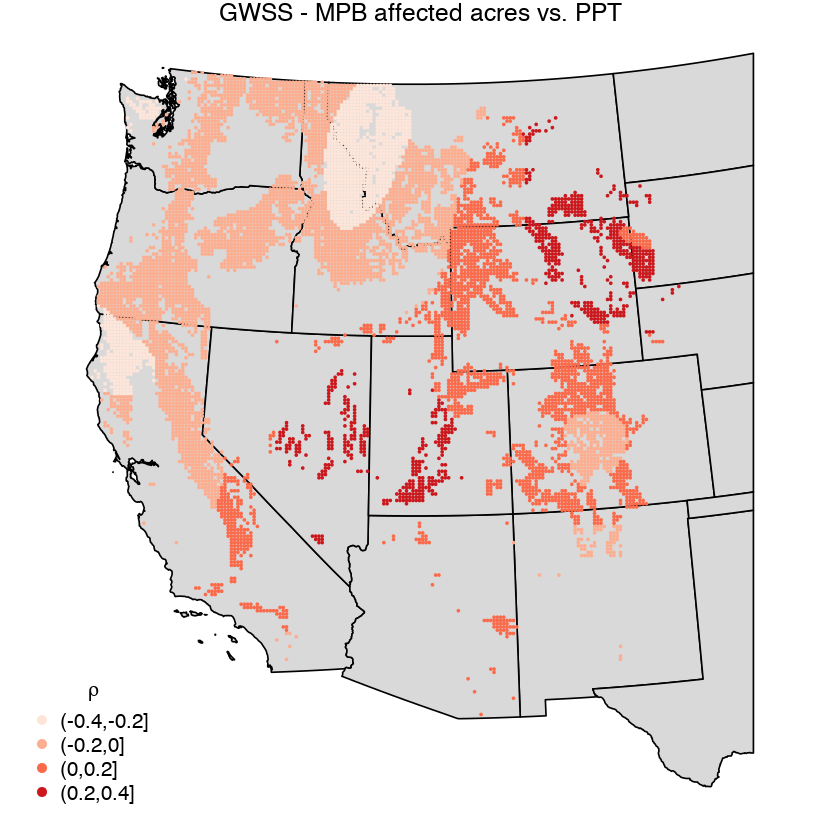

In [215]:
quick.map(localstats9$SDF,"Corr_beetleAcres.PPT",
          expression(rho),"GWSS - MPB affected acres vs. PPT")

In [43]:
localstats10 <- gwss(spdf, vars = c("beetleAcres", "wd"), bw=500000)
head(data.frame(localstats10$SDF))

beetleAcres_LM,wd_LM,beetleAcres_LSD,wd_LSD,beetleAcres_LVar,wd_LVar,beetleAcres_LSKe,wd_LSKe,beetleAcres_LCV,wd_LCV,Cov_beetleAcres.wd,Corr_beetleAcres.wd,Spearman_rho_beetleAcres.wd,x,y,optional
191.1481,1927.994,473.4072,828.8970,224114.4,687070.2,6.744896,0.3080798,2.476651,0.4299272,-82099.69,-0.2090009,-0.2353408,-990000,-460000,TRUE
198.3667,1914.633,493.6407,845.4130,243681.1,714723.2,6.556837,0.3147276,2.488525,0.4415535,-89356.77,-0.2138982,-0.2512413,-980000,-440000,TRUE
200.8600,1901.271,490.2160,832.1464,240311.8,692467.6,6.500783,0.2994445,2.440585,0.4376790,-85625.36,-0.2096892,-0.2343844,-970000,-460000,TRUE
201.9140,1901.457,495.8820,839.5374,245899.0,704823.1,6.475848,0.3056803,2.455907,0.4415232,-88313.99,-0.2119219,-0.2425785,-970000,-450000,TRUE
236.1679,1917.225,598.6117,994.5487,358335.9,989127.2,5.466804,0.3781349,2.534687,0.5187440,-116672.05,-0.1957868,-0.3241928,-970000,-240000,TRUE
237.5975,1919.948,601.7286,1003.4243,362077.3,1006860.3,5.426110,0.3826050,2.532554,0.5226310,-116557.82,-0.1928604,-0.3238924,-970000,-230000,TRUE


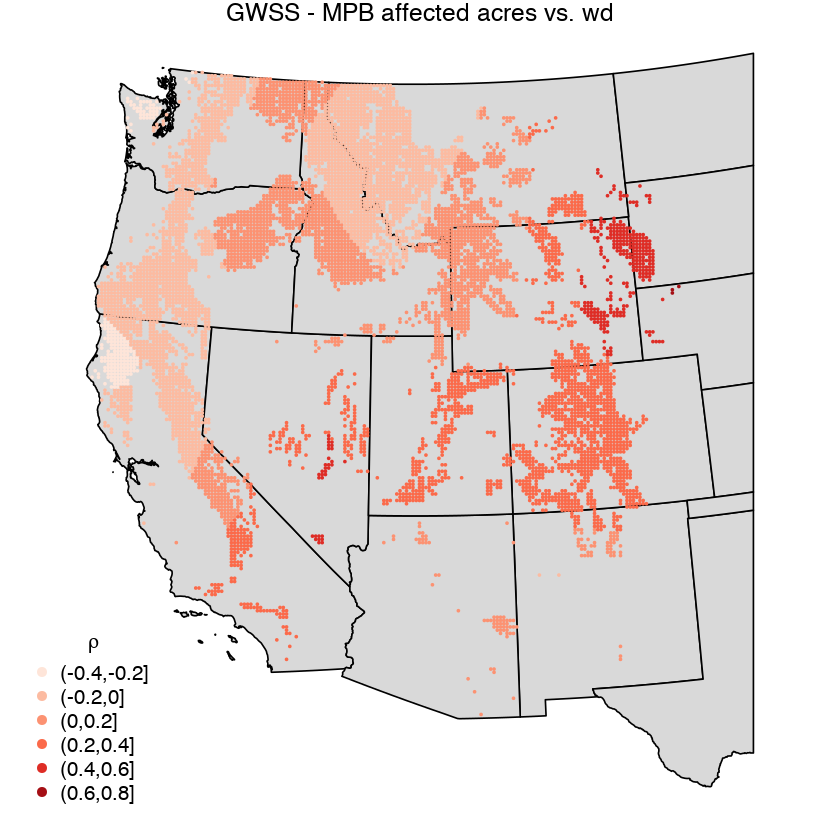

In [214]:
quick.map(localstats10$SDF,"Corr_beetleAcres.wd",
          expression(rho),"GWSS - MPB affected acres vs. wd")

In [45]:
localstats11 <- gwss(spdf, vars = c("beetleAcres", "cwd"), bw=500000)
head(data.frame(localstats11$SDF))

beetleAcres_LM,cwd_LM,beetleAcres_LSD,cwd_LSD,beetleAcres_LVar,cwd_LVar,beetleAcres_LSKe,cwd_LSKe,beetleAcres_LCV,cwd_LCV,Cov_beetleAcres.cwd,Corr_beetleAcres.cwd,Spearman_rho_beetleAcres.cwd,x,y,optional
191.1481,619.1802,473.4072,106.3573,224114.4,11311.87,6.744896,-0.5081109,2.476651,0.1717711,4237.475,0.08407117,0.2438468,-990000,-460000,TRUE
198.3667,614.2450,493.6407,107.3427,243681.1,11522.46,6.556837,-0.5020548,2.488525,0.1747556,4039.855,0.07616260,0.2422138,-980000,-440000,TRUE
200.8600,621.5076,490.2160,106.6053,240311.8,11364.68,6.500783,-0.5086372,2.440585,0.1715269,4111.202,0.07858931,0.2399273,-970000,-460000,TRUE
201.9140,618.4214,495.8820,107.0591,245899.0,11461.64,6.475848,-0.5060998,2.455907,0.1731167,4026.580,0.07577036,0.2399904,-970000,-450000,TRUE
236.1679,556.2175,598.6117,113.5345,358335.9,12890.08,5.466804,-0.4097096,2.534687,0.2041189,3909.381,0.05746756,0.2209926,-970000,-240000,TRUE
237.5975,553.1560,601.7286,113.8264,362077.3,12956.45,5.426110,-0.4062388,2.532554,0.2057763,3942.589,0.05750755,0.2187876,-970000,-230000,TRUE


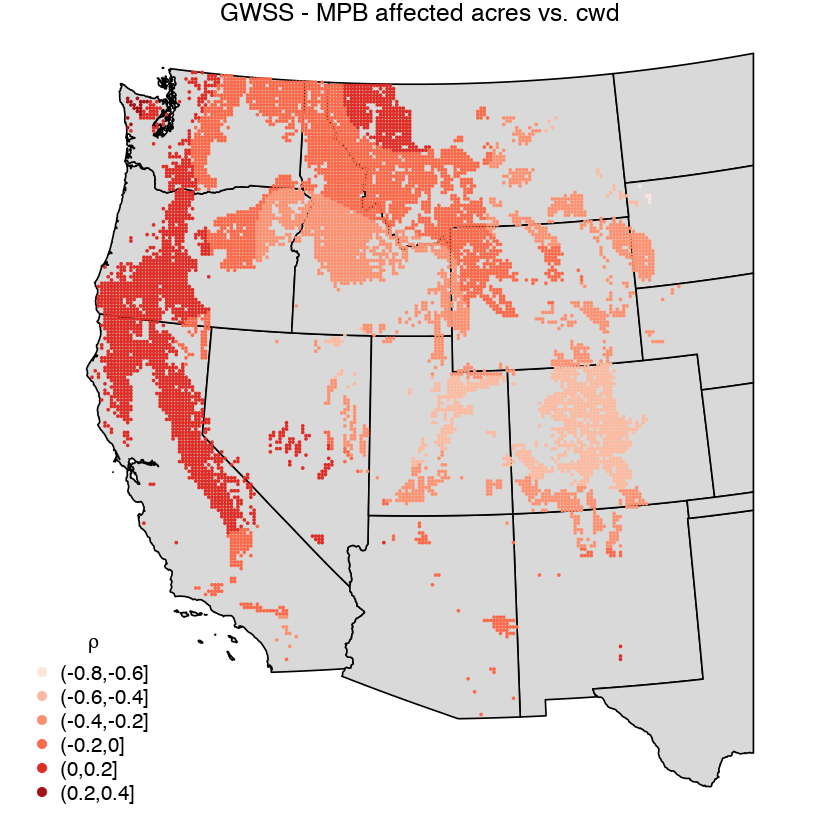

In [213]:
quick.map(localstats11$SDF,"Corr_beetleAcres.cwd",
          expression(rho),"GWSS - MPB affected acres vs. cwd")

In [47]:
localstats12 <- gwss(spdf, vars = c("beetleAcres", "vpd"), bw=500000)
head(data.frame(localstats12$SDF))

beetleAcres_LM,vpd_LM,beetleAcres_LSD,vpd_LSD,beetleAcres_LVar,vpd_LVar,beetleAcres_LSKe,vpd_LSKe,beetleAcres_LCV,vpd_LCV,Cov_beetleAcres.vpd,Corr_beetleAcres.vpd,Spearman_rho_beetleAcres.vpd,x,y,optional
191.1481,214896.5,473.4072,38964.52,224114.4,1518233875,6.744896,-0.11934943,2.476651,0.1813176,-1422632,-0.07704249,0.005638941,-990000,-460000,TRUE
198.3667,213131.0,493.6407,39001.57,243681.1,1521122583,6.556837,-0.12465218,2.488525,0.1829934,-1598766,-0.08295669,0.006723230,-980000,-440000,TRUE
200.8600,214820.4,490.2160,38992.12,240311.8,1520385628,6.500783,-0.08328734,2.440585,0.1815103,-1589036,-0.08304821,-0.005301994,-970000,-460000,TRUE
201.9140,213960.5,495.8820,38998.26,245899.0,1520863941,6.475848,-0.09623069,2.455907,0.1822684,-1638784,-0.08465702,-0.001764709,-970000,-450000,TRUE
236.1679,196015.1,598.6117,39603.42,358335.9,1568430872,5.466804,-0.20964412,2.534687,0.2020427,-2160802,-0.09105942,0.018140190,-970000,-240000,TRUE
237.5975,195120.7,601.7286,39650.25,362077.3,1572142300,5.426110,-0.20977898,2.532554,0.2032088,-2163982,-0.09061375,0.017241671,-970000,-230000,TRUE


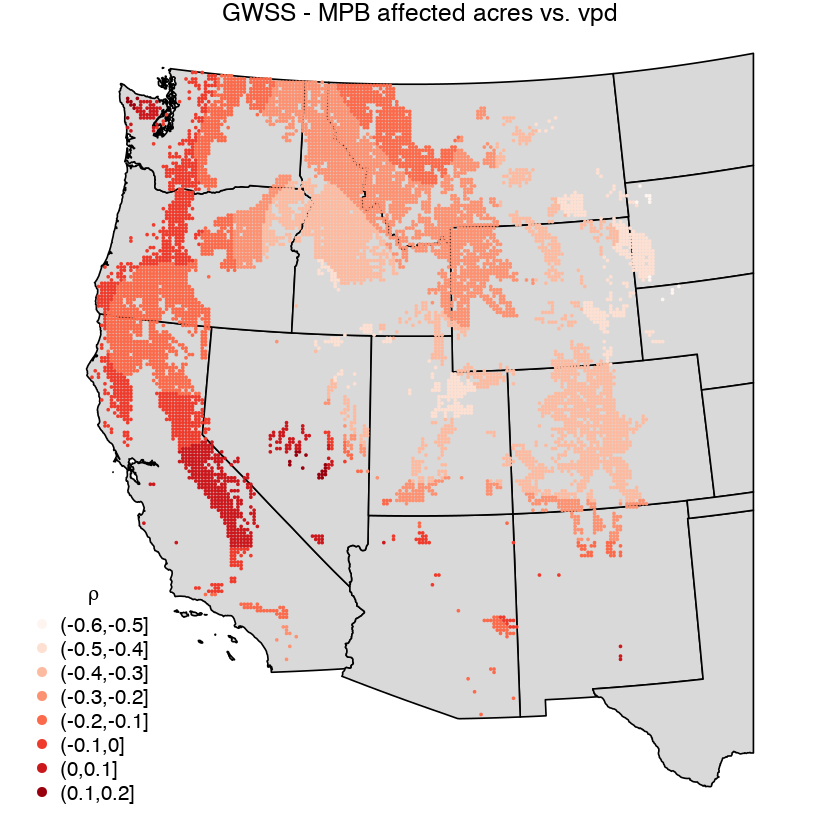

In [212]:
quick.map(localstats12$SDF,"Corr_beetleAcres.vpd",
          expression(rho),"GWSS - MPB affected acres vs. vpd")

In [49]:
localstats13 <- gwss(spdf, vars = c("beetleAcres", "mfri"), bw=500000)
head(data.frame(localstats13$SDF))

beetleAcres_LM,mfri_LM,beetleAcres_LSD,mfri_LSD,beetleAcres_LVar,mfri_LVar,beetleAcres_LSKe,mfri_LSKe,beetleAcres_LCV,mfri_LCV,Cov_beetleAcres.mfri,Corr_beetleAcres.mfri,Spearman_rho_beetleAcres.mfri,x,y,optional
191.1481,4.323483,473.4072,3.633599,224114.4,13.20304,6.744896,2.375203,2.476651,0.8404333,94.94145,0.05513482,0.11918516,-990000,-460000,TRUE
198.3667,4.440179,493.6407,3.788506,243681.1,14.35278,6.556837,2.293662,2.488525,0.8532327,102.85224,0.05494073,0.11221478,-980000,-440000,TRUE
200.8600,4.395399,490.2160,3.701219,240311.8,13.69902,6.500783,2.309240,2.440585,0.8420667,97.26707,0.05355430,0.11912773,-970000,-460000,TRUE
201.9140,4.434283,495.8820,3.759606,245899.0,14.13463,6.475848,2.287207,2.455907,0.8478497,100.67607,0.05394738,0.11563041,-970000,-450000,TRUE
236.1679,5.736301,598.6117,5.201314,358335.9,27.05367,5.466804,1.560667,2.534687,0.9067366,200.79170,0.06442809,0.06684064,-970000,-240000,TRUE
237.5975,5.822876,601.7286,5.273075,362077.3,27.80532,5.426110,1.521070,2.532554,0.9055790,204.79942,0.06448388,0.06548291,-970000,-230000,TRUE


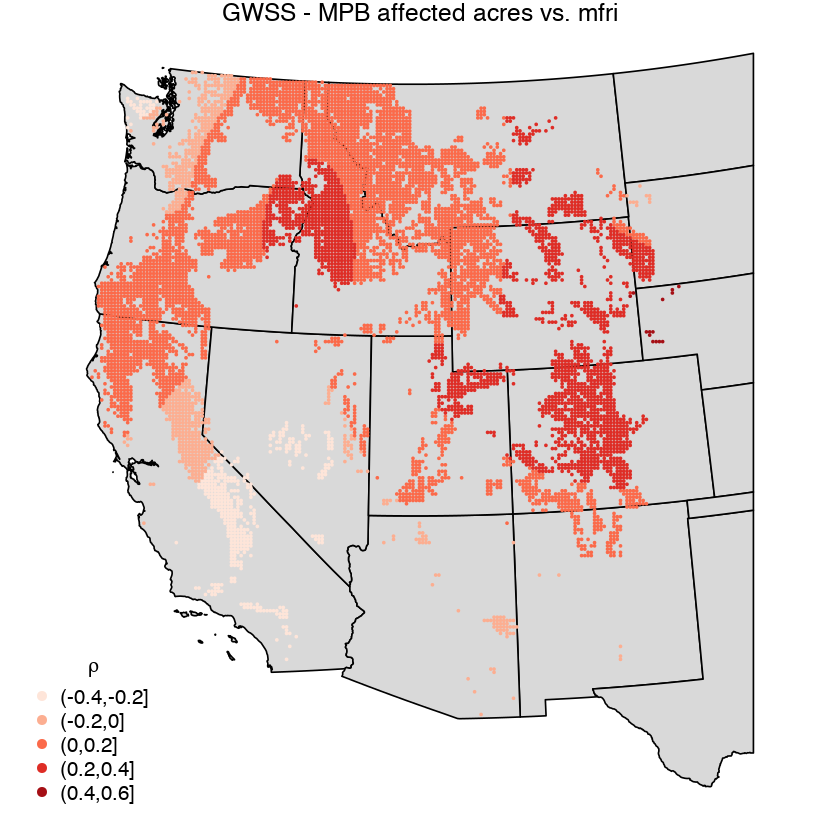

In [211]:
quick.map(localstats13$SDF,"Corr_beetleAcres.mfri",
          expression(rho),"GWSS - MPB affected acres vs. mfri")

In [51]:
localstats14 <- gwss(spdf, vars = c("beetleAcres", "ddAugJul"), bw=500000)
head(data.frame(localstats14$SDF))

beetleAcres_LM,ddAugJul_LM,beetleAcres_LSD,ddAugJul_LSD,beetleAcres_LVar,ddAugJul_LVar,beetleAcres_LSKe,ddAugJul_LSKe,beetleAcres_LCV,ddAugJul_LCV,Cov_beetleAcres.ddAugJul,Corr_beetleAcres.ddAugJul,Spearman_rho_beetleAcres.ddAugJul,x,y,optional
191.1481,2209.135,473.4072,509.2450,224114.4,259330.5,6.744896,0.4129262,2.476651,0.2305178,-61433.38,-0.2545569,-0.3923206,-990000,-460000,TRUE
198.3667,2180.034,493.6407,509.9488,243681.1,260047.7,6.556837,0.4034502,2.488525,0.2339178,-67708.42,-0.2686983,-0.4066064,-980000,-440000,TRUE
200.8600,2195.723,490.2160,520.0581,240311.8,270460.4,6.500783,0.4166476,2.440585,0.2368505,-64988.84,-0.2546597,-0.3968819,-970000,-460000,TRUE
201.9140,2184.637,495.8820,517.4543,245899.0,267758.9,6.475848,0.4133017,2.455907,0.2368605,-67267.82,-0.2618917,-0.4030208,-970000,-450000,TRUE
236.1679,1960.121,598.6117,470.3706,358335.9,221248.5,5.466804,0.2017677,2.534687,0.2399702,-96994.52,-0.3441515,-0.4996094,-970000,-240000,TRUE
237.5975,1949.709,601.7286,468.0002,362077.3,219024.2,5.426110,0.1917291,2.532554,0.2400359,-97527.67,-0.3459937,-0.5033613,-970000,-230000,TRUE


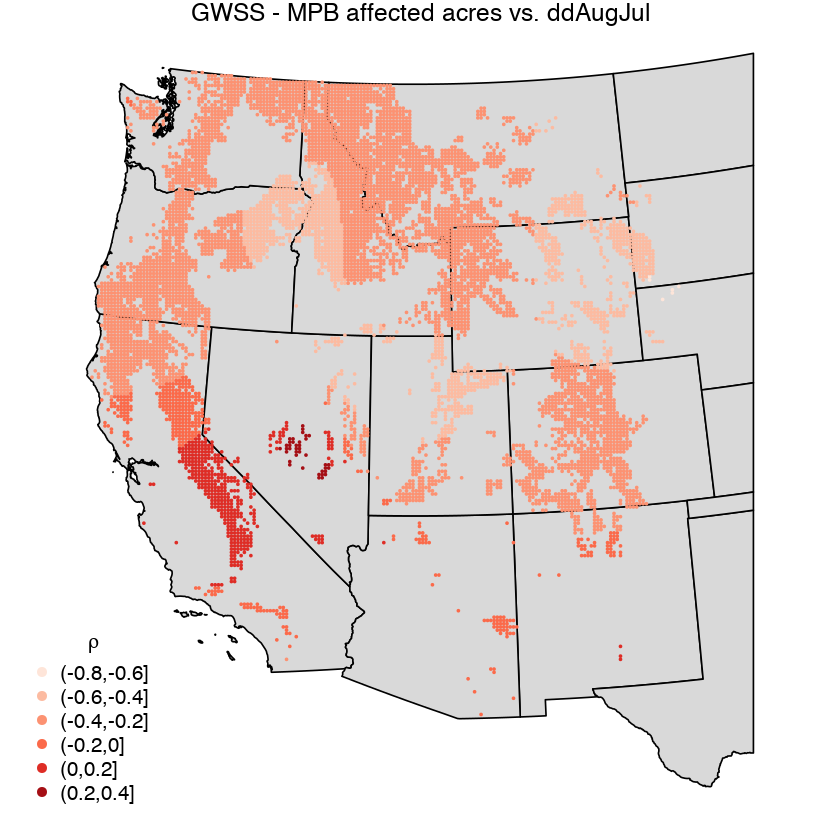

In [210]:
quick.map(localstats14$SDF,"Corr_beetleAcres.ddAugJul",
          expression(rho),"GWSS - MPB affected acres vs. ddAugJul")

In [148]:
vars <- c('mStdAge','density','vcc','mfri','prs', 'vpd', 'cwd', 'summerP0', 'Tmean', 'wd', 'PPT', 'ddAugJul')
varnms <- paste0("Corr_beetleAcres.", vars)

In [149]:
ndf <- cbind(data.frame(localstats1$SDF), data.frame(localstats2$SDF), data.frame(localstats3$SDF),
             data.frame(localstats4$SDF), data.frame(localstats5$SDF), data.frame(localstats6$SDF),
             data.frame(localstats7$SDF), data.frame(localstats8$SDF), data.frame(localstats9$SDF),
             data.frame(localstats10$SDF), data.frame(localstats11$SDF), data.frame(localstats12$SDF),
             data.frame(localstats13$SDF), data.frame(localstats14$SDF))

In [150]:
df <- ndf[,varnms]

In [151]:
head(df)

Corr_beetleAcres.mStdAge,Corr_beetleAcres.density,Corr_beetleAcres.vcc,Corr_beetleAcres.mfri,Corr_beetleAcres.prs,Corr_beetleAcres.vpd,Corr_beetleAcres.cwd,Corr_beetleAcres.summerP0,Corr_beetleAcres.Tmean,Corr_beetleAcres.wd,Corr_beetleAcres.PPT,Corr_beetleAcres.ddAugJul
0.04255628,-0.07970615,0.1642529,0.05513482,0.08843232,-0.07704249,0.08407117,0.1514612,-0.2872496,-0.2090009,-0.2103718,-0.2545569
0.03918333,-0.08467842,0.1680076,0.05494073,0.09607517,-0.08295669,0.07616260,0.1572834,-0.3027200,-0.2138982,-0.2186233,-0.2686983
0.04179984,-0.07816466,0.1675203,0.05355430,0.09043468,-0.08304821,0.07858931,0.1513380,-0.2867519,-0.2096892,-0.2138668,-0.2546597
0.04027449,-0.08102936,0.1686056,0.05394738,0.09369126,-0.08465702,0.07577036,0.1545485,-0.2948648,-0.2119219,-0.2169889,-0.2618917
0.04214881,-0.08643233,0.1415188,0.06442809,0.12373847,-0.09105942,0.05746756,0.1525448,-0.3798798,-0.1957868,-0.2022500,-0.3441515
0.04323533,-0.08491473,0.1382205,0.06448388,0.12351927,-0.09061375,0.05750755,0.1499969,-0.3815724,-0.1928604,-0.1985606,-0.3459937


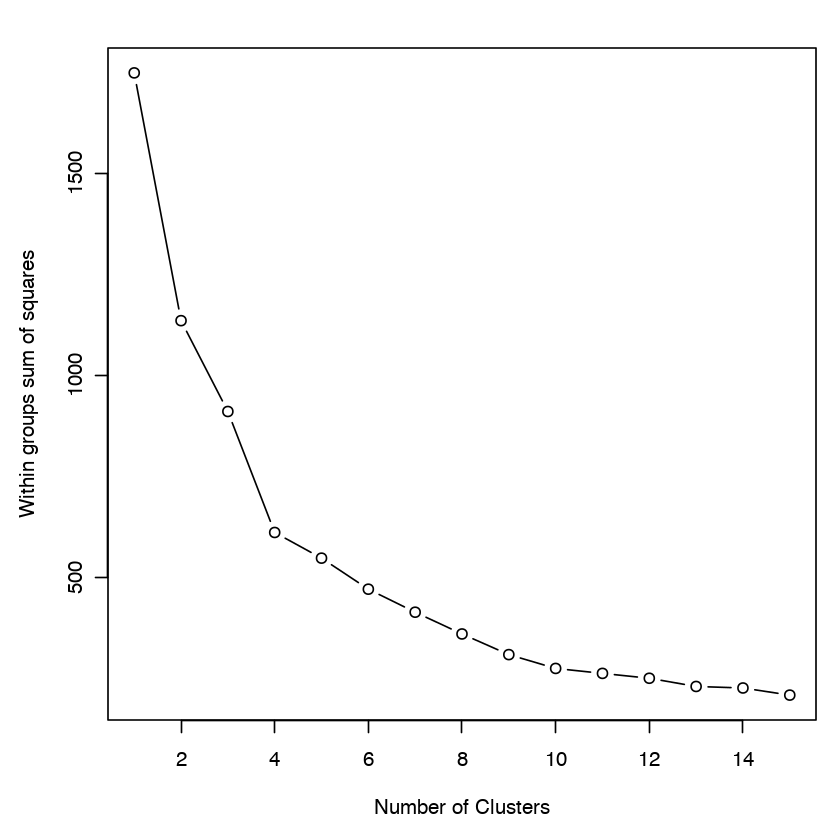

In [198]:
#remove(var)
wss <- (nrow(df)-1)*sum(apply(df,2,var))
par(mfrow=c(1,1),mar=c(5,4.5,2,1))
for (i in 2:15) wss[i] <- sum(kmeans(df, centers=i)$withinss)
plot(1:15, wss, type="b", xlab="Number of Clusters",
     ylab="Within groups sum of squares") 

In [203]:
ncluster <- 4
fit <- kmeans(df, ncluster)
nclr <- ncluster
plotclr <- brewer.pal(nclr,"Set1")

In [204]:
plotvar <- fit$cluster
class <- classIntervals(plotvar, nclr, style="equal")
colcode <- findColours(class, plotclr)

Warning message in classIntervals(plotvar, nclr, style = "equal"):
“n same as number of different finite values\neach different finite value is a separate class”

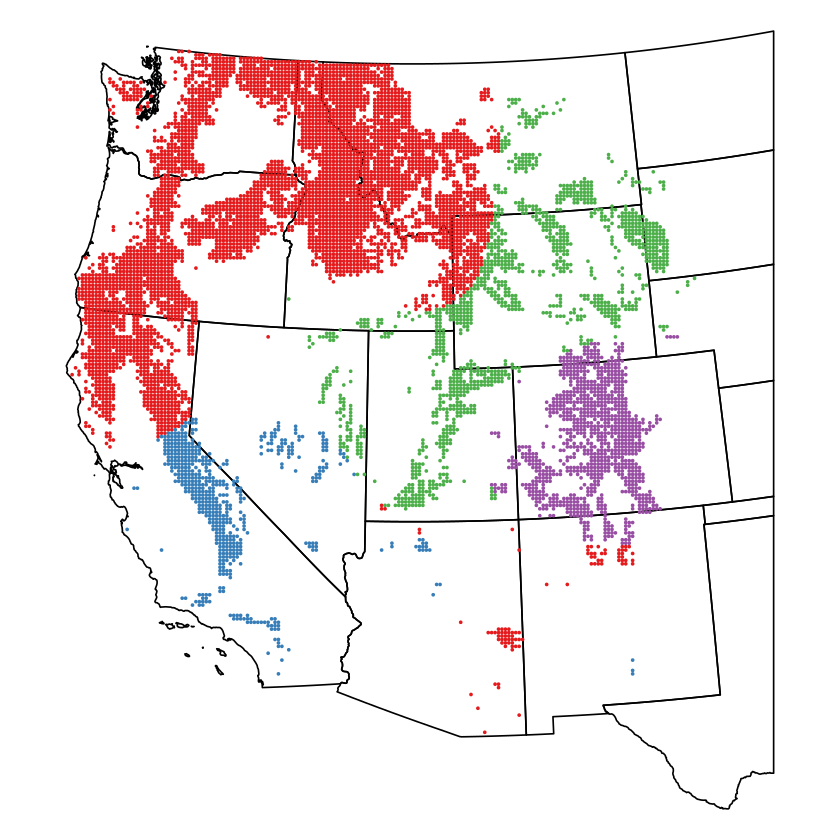

In [205]:
par(mfrow=c(1,1),mar=c(0,0,0,0))
plot(mpb10km_poly)
points(xy$x, xy$y, pch=16, col=colcode, cex=0.3)

In [206]:
df.updated <- data.frame(df, fit$cluster)

In [207]:
head(df.updated)

Corr_beetleAcres.mStdAge,Corr_beetleAcres.density,Corr_beetleAcres.vcc,Corr_beetleAcres.mfri,Corr_beetleAcres.prs,Corr_beetleAcres.vpd,Corr_beetleAcres.cwd,Corr_beetleAcres.summerP0,Corr_beetleAcres.Tmean,Corr_beetleAcres.wd,Corr_beetleAcres.PPT,Corr_beetleAcres.ddAugJul,fit.cluster
0.04255628,-0.07970615,0.1642529,0.05513482,0.08843232,-0.07704249,0.08407117,0.1514612,-0.2872496,-0.2090009,-0.2103718,-0.2545569,1
0.03918333,-0.08467842,0.1680076,0.05494073,0.09607517,-0.08295669,0.07616260,0.1572834,-0.3027200,-0.2138982,-0.2186233,-0.2686983,1
0.04179984,-0.07816466,0.1675203,0.05355430,0.09043468,-0.08304821,0.07858931,0.1513380,-0.2867519,-0.2096892,-0.2138668,-0.2546597,1
0.04027449,-0.08102936,0.1686056,0.05394738,0.09369126,-0.08465702,0.07577036,0.1545485,-0.2948648,-0.2119219,-0.2169889,-0.2618917,1
0.04214881,-0.08643233,0.1415188,0.06442809,0.12373847,-0.09105942,0.05746756,0.1525448,-0.3798798,-0.1957868,-0.2022500,-0.3441515,1
0.04323533,-0.08491473,0.1382205,0.06448388,0.12351927,-0.09061375,0.05750755,0.1499969,-0.3815724,-0.1928604,-0.1985606,-0.3459937,1


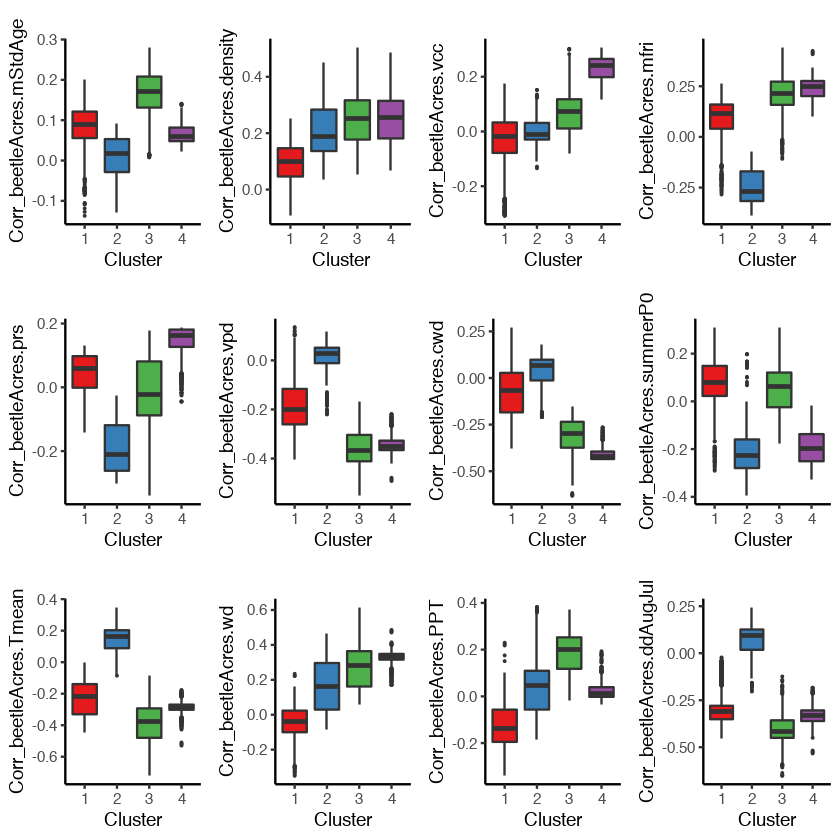

In [208]:
n1 <- c(rep(1,4),rep(2,4),rep(3,4)); n2 <- rep(c(1,2,3,4),3) 
grid.newpage()
pushViewport(viewport(layout = grid.layout(3, 4)))
for(v in varnms){
    sdf <- df.updated[, c(v, 'fit.cluster')]
    colnames(sdf)[1] <- 'var'
    g <- ggplot(sdf, aes(x=as.factor(fit.cluster), y=var, fill=as.factor(fit.cluster)))+
      scale_fill_manual(values = plotclr) +
      geom_boxplot(outlier.size = 0.05)+labs(title='', x="Cluster", y = v)+
      theme_classic() + theme(legend.position="none") 
    i <- which(varnms==v)
    print(g, vp = vplayout(n1[i], n2[i]))
}

In [127]:
head(spdf)

         coordinates       lon      lat   etopo1 beetleAcres host forest
1 (-990000, -460000) -124.1712 40.22942 365.1772        0.80    1      1
2 (-980000, -440000) -124.0860 40.42007 493.0852        0.80    0      1
3 (-970000, -460000) -123.9379 40.25447 487.5240        0.80    1      1
4 (-970000, -450000) -123.9535 40.34353 350.6961        0.80    0      1
5 (-970000, -240000) -124.2945 42.21193 387.5008        2.10    1      1
6 (-970000, -230000) -124.3114 42.30082 409.5534      331.05    1      1
    mStdAge  density vcc mfri prs pms pls GAP1 GAP2 GAP3      vpd      cwd
1  25.50000 58050.83   1    2   1   5  16    0    0    0 160458.6 461.5879
2  42.46217 52809.04   1    2   1   5  16    0    0    0 165345.4 477.4650
3 169.82977 54385.98   1    2   1   5  16    0    0    0 189881.3 493.7067
4 249.11995 47005.25   1    2   1   5  16    0    1    0 186847.8 488.0910
5 102.39621 51167.16   3    2   1   5  16    0    0    0 119449.8 363.4541
6  83.12288 54697.57   3    2   1   5  

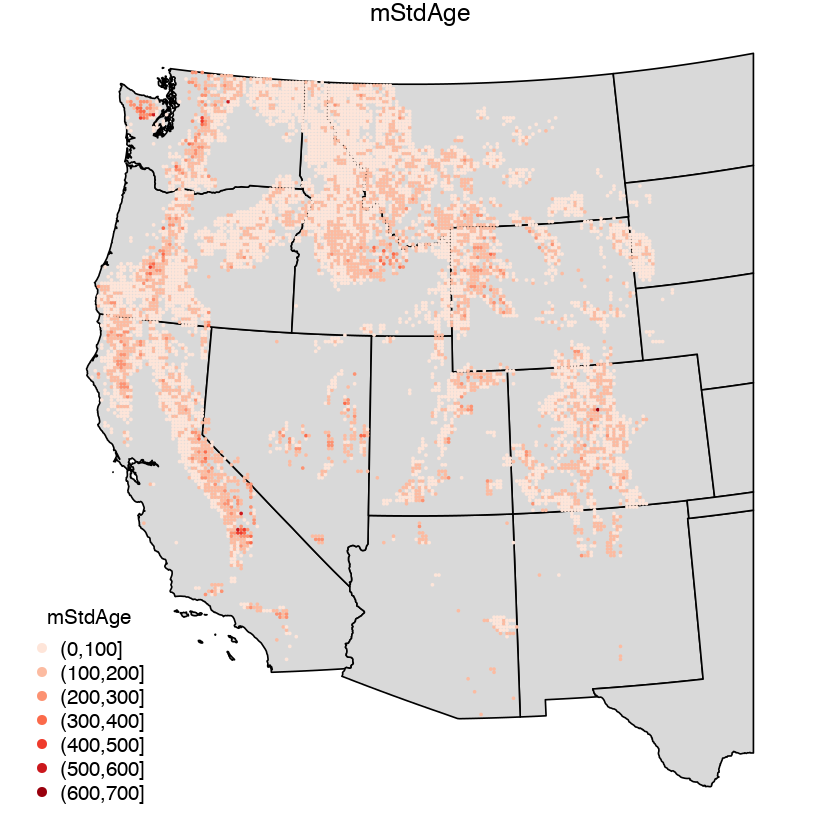

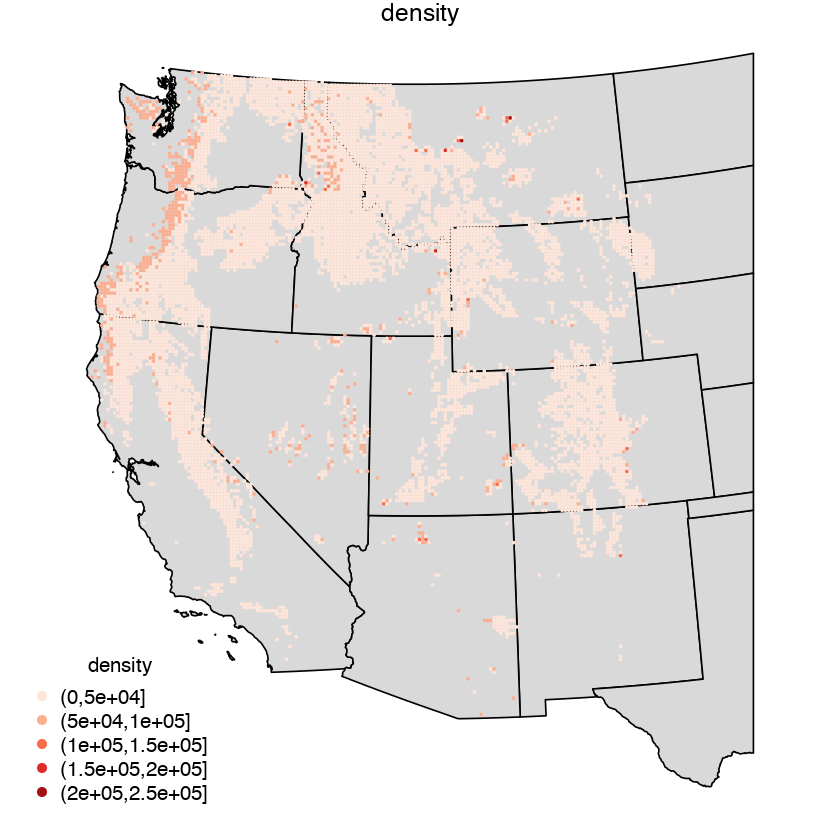

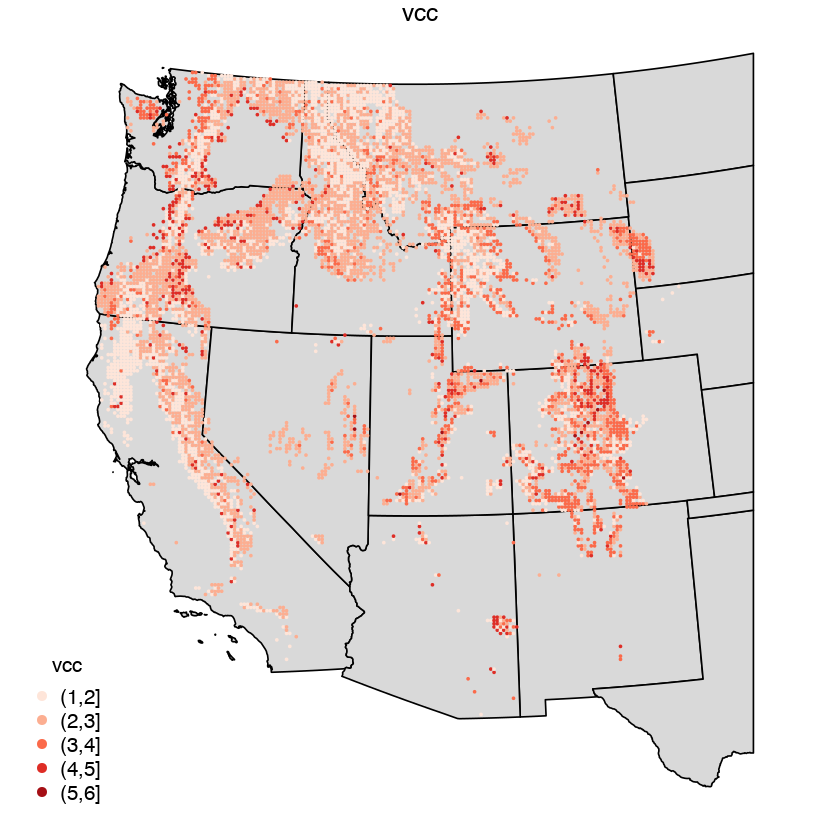

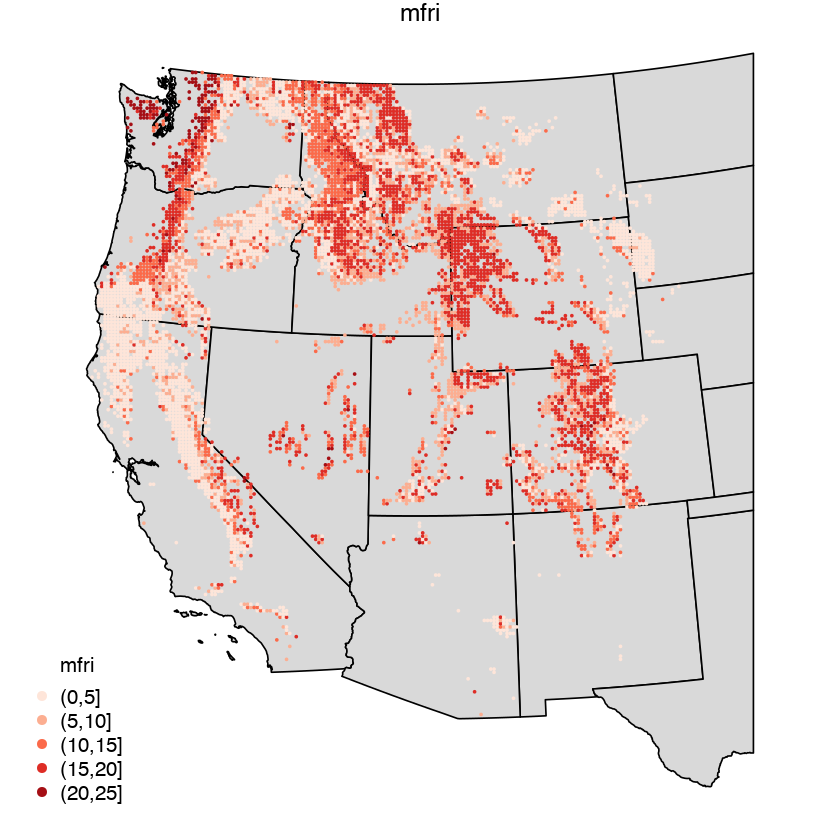

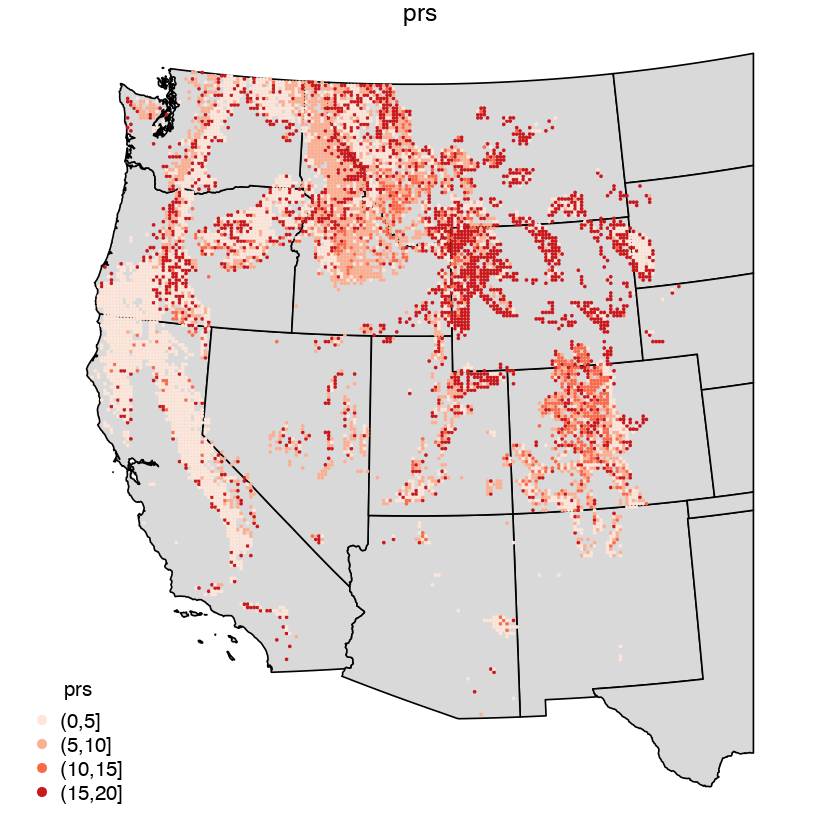

...

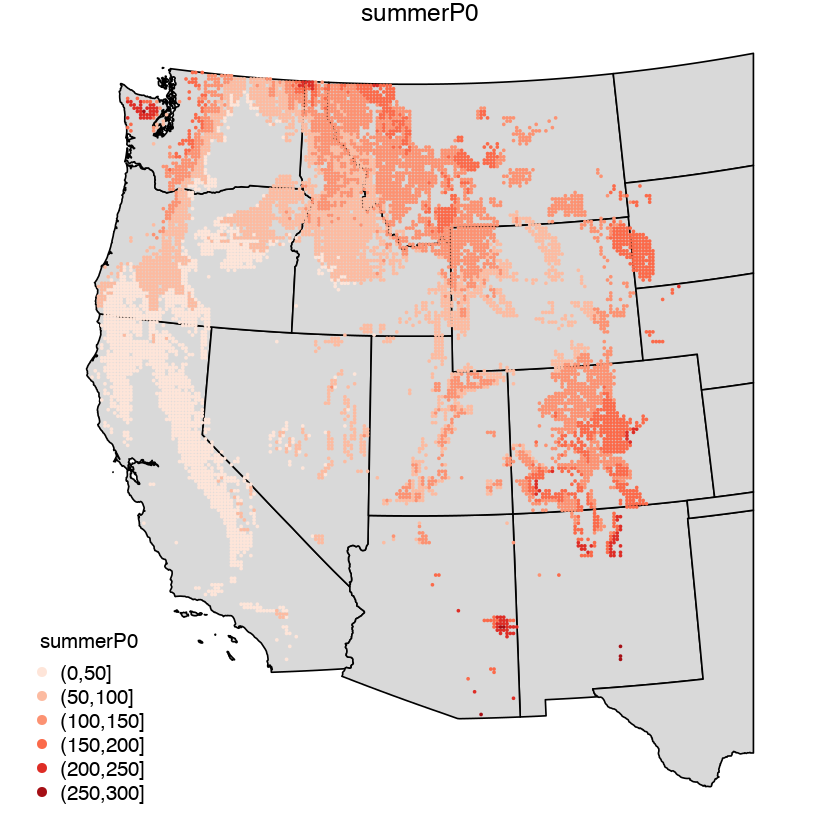

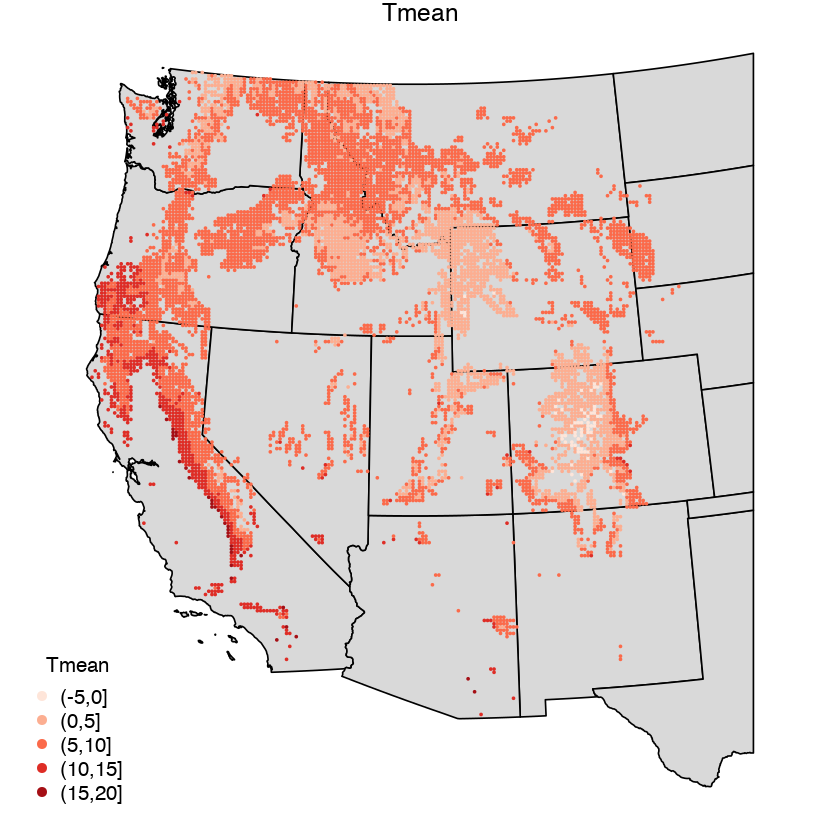

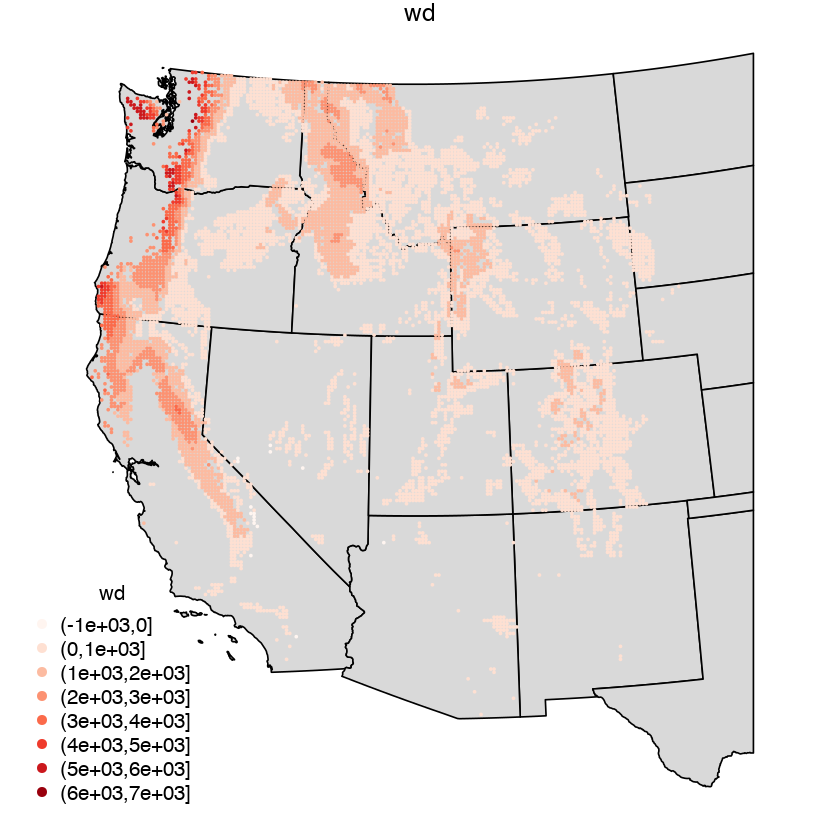

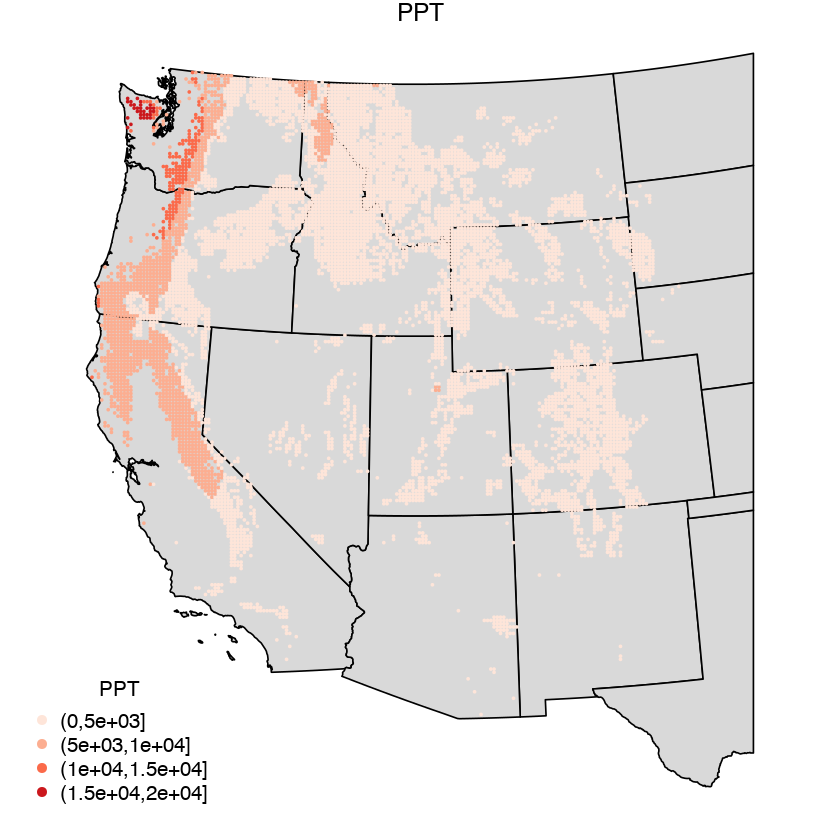

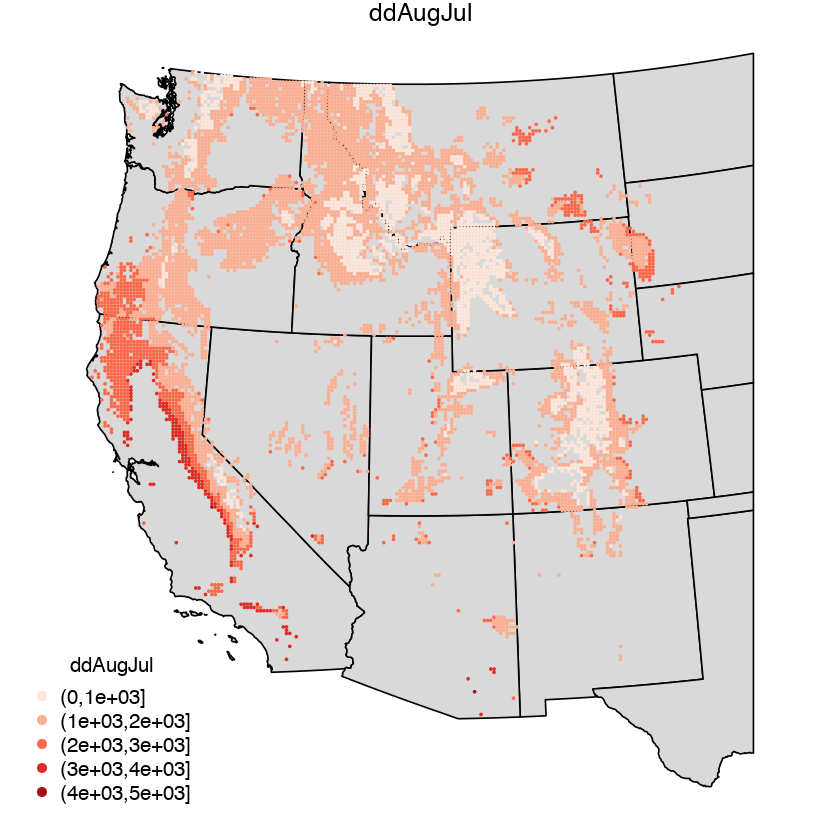

In [133]:
par(mfrow=c(1, 1))
for(v in vars){
  quick.map(spdf,v,v,v)     
}